In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import h5py
import sys
import os
import glob
import warnings

from tqdm import tqdm

basedir = '/project/vitelli/jonathan/REDO_fruitfly/'
sys.path.insert(0, os.path.join(basedir, 'src'))

warnings.filterwarnings('ignore')

In [2]:
from dataset import *

tb_logs = '/project/vitelli/jonathan/REDO_fruitfly/tb_logs'    
    
from plot_utils import *
import seaborn as sns

plt.rcParams['font.size'] = 6
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams['image.origin'] = 'lower'
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

def residual(u, v):
    umag = np.linalg.norm(u, axis=-3)                                                 
    vmag = np.linalg.norm(v, axis=-3)                                                 

    uavg = np.sqrt((umag**2).mean(axis=(-2, -1), keepdims=True))                    
    vavg = np.sqrt((vmag**2).mean(axis=(-2, -1), keepdims=True))                    

    res = uavg**2 * vmag**2 + vavg**2 * umag**2 - 2 * uavg * vavg * np.einsum('...ijk,...ijk->...jk', u, v)
    res /= 2 * vavg**2 * uavg**2                                                        
    return res 

from sklearn.decomposition import PCA

def get_results(dataset, 
                n_components=16,
                tmin=None,
                tmax=None,
                eIDs=None, 
                whiten=False):
    df = dataset.df.drop(['folder', 'tiff'], axis=1).reset_index()
    if eIDs is not None:
        df = df[df.embryoID.isin(eIDs)].reset_index(drop=True)
    test_size = len(df) * 2 // 5
    test_idx = np.random.choice(df.index, test_size, replace=False)
        
    df['set'] = 'train'
    df.loc[test_idx, 'set'] = 'test'
    df['t'] = df['time']
    df['time'] = df['time'].astype(int)
    
    y0 = []
    for e in df.embryoID.unique():
        e_data = dataset.values[e]
        t = e_data.shape[0]
        h, w = e_data.shape[-2:]
        y0.append(e_data.reshape([t, -1, h, w]))
    y0 = np.concatenate(y0, axis=0)
    
    model = PCA(n_components=n_components, whiten=whiten)
    if tmin:
        df.loc[df.t <= tmin, 'set'] = 'test'
    if tmax:
        df.loc[df.t >= tmax, 'set'] = 'test'
    train = y0[df[df.set == 'train'].index]
    model.fit(train.reshape([train.shape[0], -1]))
    
    params = model.transform(y0.reshape([y0.shape[0], -1]))
    
    y = model.inverse_transform(params).reshape(y0.shape)
        
    df['res'] = residual(y, y0).mean(axis=(-1, -2))
    df['mag'] = np.linalg.norm(y, axis=1).mean(axis=(-1, -2))
    df = pd.concat([df, pd.DataFrame(params).add_prefix('param')], axis=1)
    
    drop_mask = df.embryoID == 202001280915
    df = df[~drop_mask]
    
    print(df.groupby('set').agg({'time': 'count'}))
    
    return model, df

def summary_plot(df, model, dataset, show_tt, show_magnitude=True, cutoff=0.9):
    fig = plt.figure(figsize=(10, 2), dpi=200)
    gs = fig.add_gridspec(1, 5)
    
    ax = fig.add_subplot(gs[0, 0])
    sns.lineplot(data=df, x='time', y='res', color='blue', ax=ax)
    ax.set_ylabel('Error Rate', color='blue')
    ax.set(ylim=[0, 1])
    
    if show_magnitude:
        ax2 = ax.twinx()
        sns.lineplot(data=df, x='time', y='mag', ax=ax2, color='red')
        ax2.set_ylabel('Magnitude', color='red')
        ax2.set_yticks([])
           
    ax = fig.add_subplot(gs[0, 1:3])
    ax.plot(np.arange(model.n_components_), np.cumsum(model.explained_variance_ratio_))
    ax.bar(np.arange(model.n_components_), model.explained_variance_ratio_)
    ax.set(xlabel='Component', ylabel='Explained Variance')
    ax.axhline(cutoff, color='black', linestyle='--')
   
    offset = 0.03
    bb1 = ax.get_position()
    bb1.x0 = bb1.x0 + offset
    ax.set_position(bb1)
    
    idx = df[df.set == 'test'].iloc[show_tt]['index']
    y0 = dataset[idx]['value']
    y = model.inverse_transform(model.transform(y0.reshape([1, -1]))).reshape(y0.shape)    
    plot_fn(fig.add_subplot(gs[:, -2]), y0)
    plt.title('Experiment')
    plot_fn(fig.add_subplot(gs[:, -1]), y)
    plt.title('ML')
    
import seaborn as sns
from plot_utils import *

plt.rcParams['lines.markersize'] = 2
def pca_plots(df, model, cutoff=0.9):
    explained = np.cumsum(model.explained_variance_ratio_) 
    keep = np.argwhere(explained <= cutoff).flatten()
    cols = ['param%d' % k for k in keep]
    
        
    dfi = pd.wide_to_long(df.reset_index(), stubnames=['param'], i='index', j='param_num').reset_index(level=1)
    dfi = dfi[dfi.param_num.isin(keep)]
    
    nrows, ncols = len(keep), len(keep)
    ss = 1.5
    fig, ax = plt.subplots(nrows, ncols, 
                           sharey='row',
                           figsize=(ss*ncols, ss*nrows), dpi=150)
    
    for ii in range(nrows):
        for jj in range(ncols):
            if ii == jj:
                sns.lineplot(
                    data=dfi[dfi.param_num==ii],
                    x='time',
                    y='param',
                    hue='embryoID',
                    palette='viridis',
                    ax=ax[ii,jj],
                    legend=False)
                ax[ii,jj].set(xlabel='Time', ylabel='', yticklabels=[])
            else:
                data = df[df.set == 'train']
                ax[ii, jj].scatter(data['param%d' % ii], data['param%d' % jj], c=data['time'], cmap='Blues')
                data = df[df.set == 'test']
                ax[ii, jj].scatter(data['param%d' % ii], data['param%d' % jj], c=data['time'], cmap='Reds')
            
                if ii == 0:
                    ax[ii,jj].xaxis.tick_top()
                    ax[ii, jj].set_xlabel('Param %d' % jj)
                    ax[ii,jj].xaxis.set_label_position('top')
                elif ii == nrows-1 and jj == 0:
                    ax[ii, jj].set_xlabel('Param %d' % jj)
                
                ax[ii,jj].set(xticklabels=[], yticklabels=[])

            if jj == 0:
                ax[ii,jj].set_ylabel('Param %d' % ii)
                

    values = df[cols].values
                
    plt.tight_layout()
            
    fig = plt.figure(figsize=(6, len(keep)), dpi=150)
    gs = fig.add_gridspec(len(keep), 5)
    for i in range(len(keep)):
        points = np.zeros([gs.ncols-1, model.n_components])
        points[:, :values.shape[1]] = np.mean(values, axis=0, keepdims=True)
        r0, r1 = np.percentile(values[:, i], [10, 90])
        points[:, i] = np.linspace(0, 1, points.shape[0]) * (r1-r0) + r0

        z = model.inverse_transform(points).reshape([points.shape[0], -1, 236, 200])
        
        colors = plt.cm.Purples(np.linspace(0, 1, points.shape[0]+1))[1:]    

        vmax = np.max(np.linalg.norm(z, axis=1))

        for j in range(len(colors)):
            a = fig.add_subplot(gs[i, j])
            plot_fn(a, z[j], vmax=vmax)
            #ax.axhline(points[j, i], zorder=-1, color=colors[j])
            for spine in a.spines.values():
                spine.set_edgecolor(colors[j])
                spine.set_linewidth(2)
            
    plt.tight_layout()
    

# PCA on datasets

Rather than use the VAEs, we're going to attempt a linear method and perform PCA on the data directly

In [3]:
transform = Reshape2DField()

cad_dataset = AtlasDataset('WT', 'ECad-GFP', 'tensor2D', transform=transform)
cvel_dataset = AtlasDataset('WT', 'ECad-GFP', 'velocity2D', transform=transform)
sqh_dataset = AtlasDataset('WT', 'sqh-mCherry', 'tensor2D', transform=transform)
svel_dataset = AtlasDataset('WT', 'sqh-mCherry', 'velocity2D', transform=transform)
runt_dataset = AtlasDataset('WT', 'Runt', 'raw2D', transform=transform)
rvel_dataset = AtlasDataset('WT', 'Runt', 'velocity2D', transform=transform)

100%|██████████| 6/6 [00:00<00:00, 24.77it/s]


       time
set        
test    152
train   238


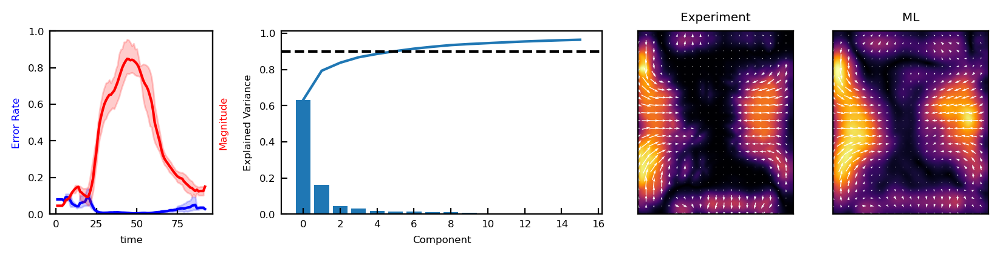

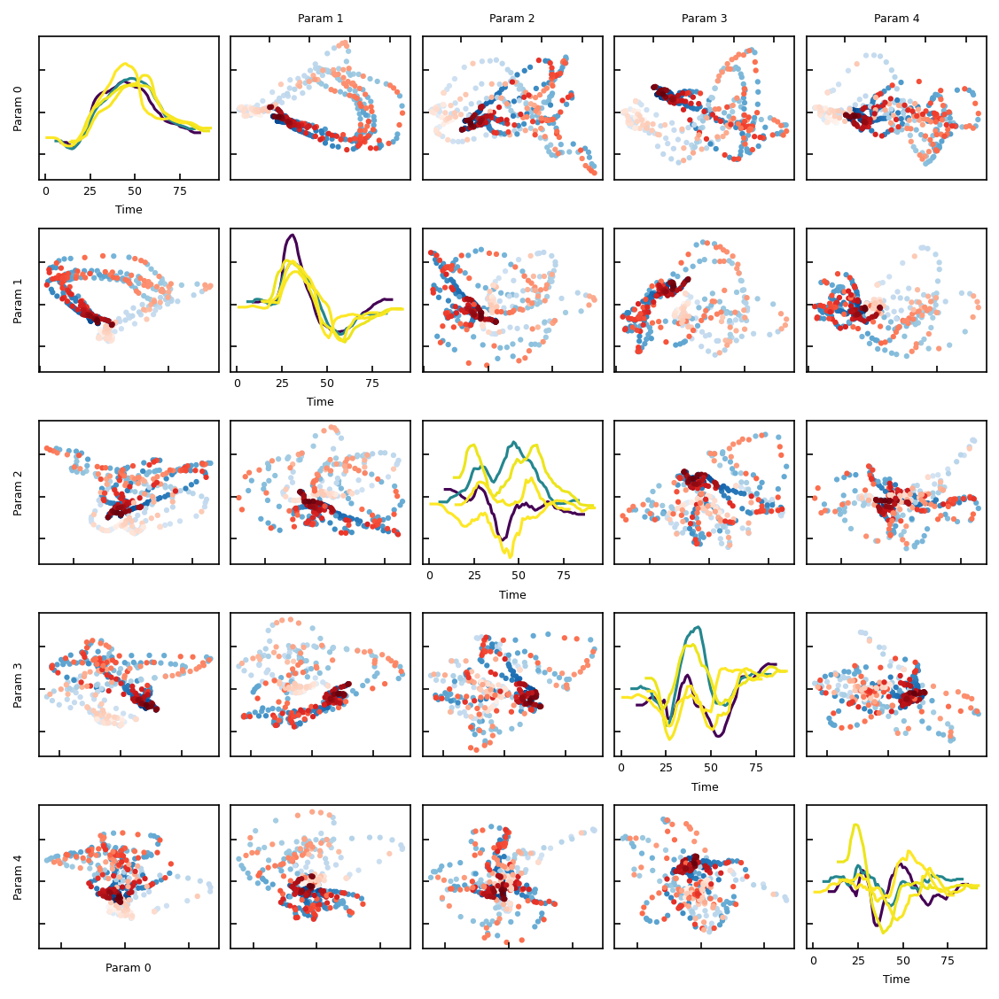

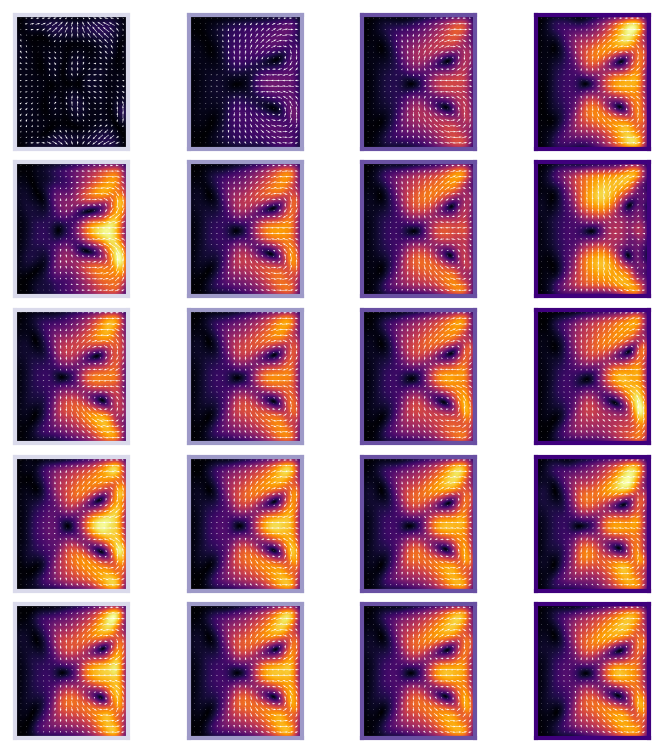

In [4]:
cvel_model, cvel_df = get_results(cvel_dataset, whiten=True)
plot_fn = plot_vector2D
summary_plot(cvel_df, cvel_model, cvel_dataset, 0, show_magnitude=True)
pca_plots(cvel_df, cvel_model)

       time
set        
test    664
train   991


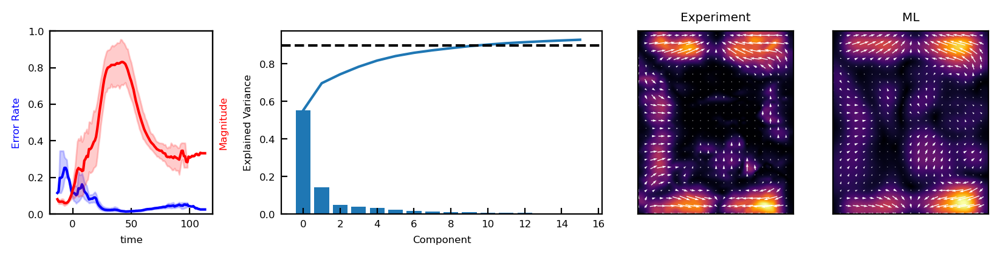

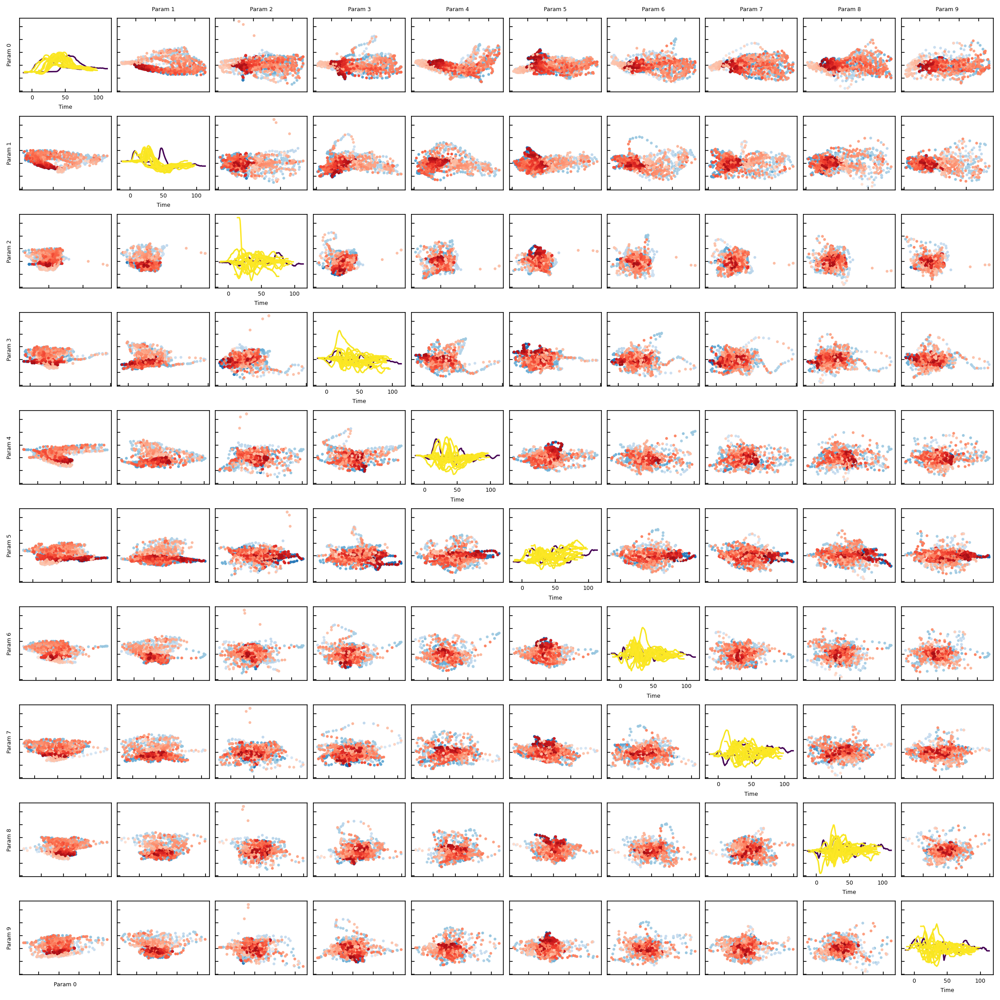

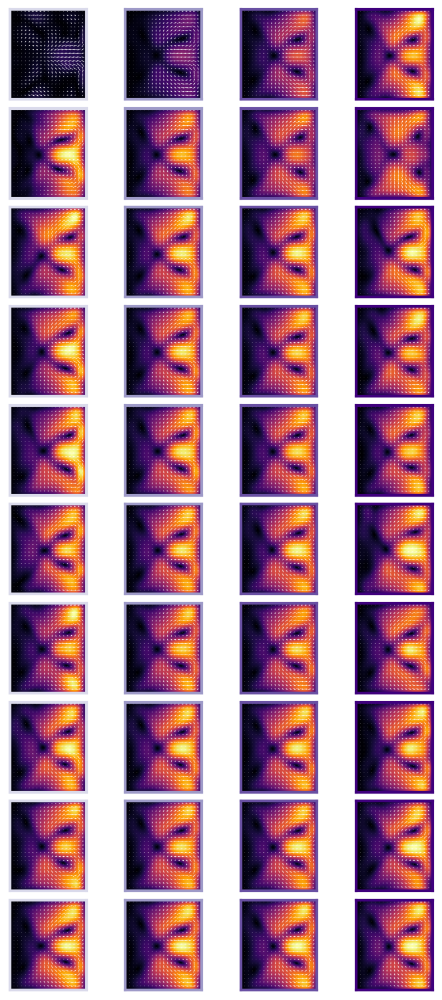

In [7]:
svel_model, svel_df = get_results(svel_dataset, whiten=True)
plot_fn = plot_vector2D
summary_plot(svel_df, svel_model, svel_dataset, 0, show_magnitude=True)
pca_plots(svel_df, svel_model)

       time
set        
test    156
train   234


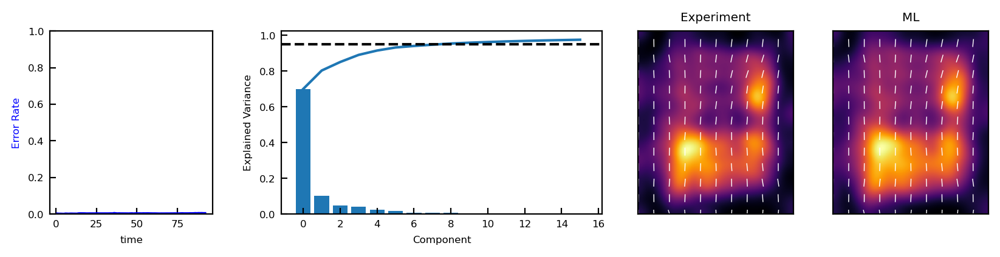

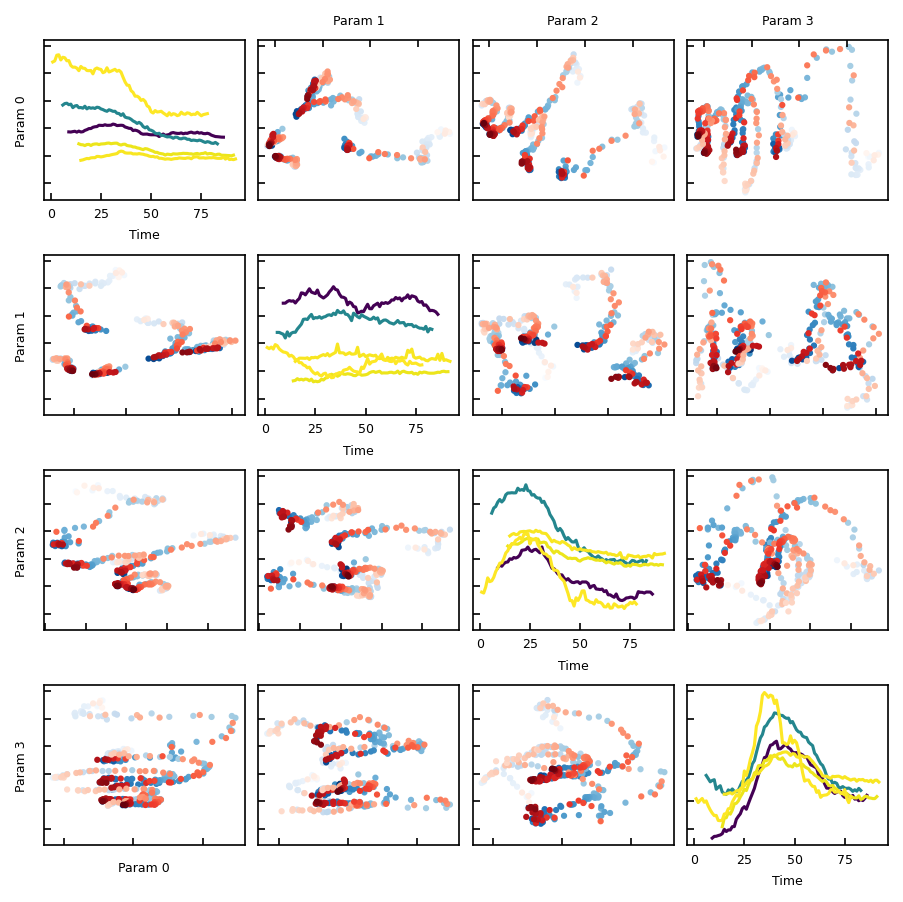

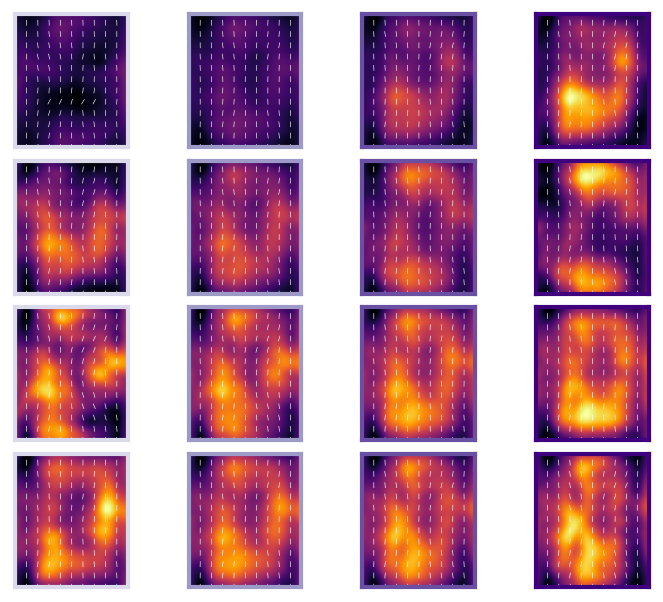

In [5]:
sqh_model, sqh_df = get_results(sqh_dataset, eIDs=cvel_df.embryoID.unique(), whiten=True)
plot_fn = plot_tensor2D
summary_plot(sqh_df, sqh_model, sqh_dataset, 5, show_magnitude=False, cutoff=0.95)
pca_plots(sqh_df, sqh_model, cutoff=0.9)

       time
set        
test    162
train   228


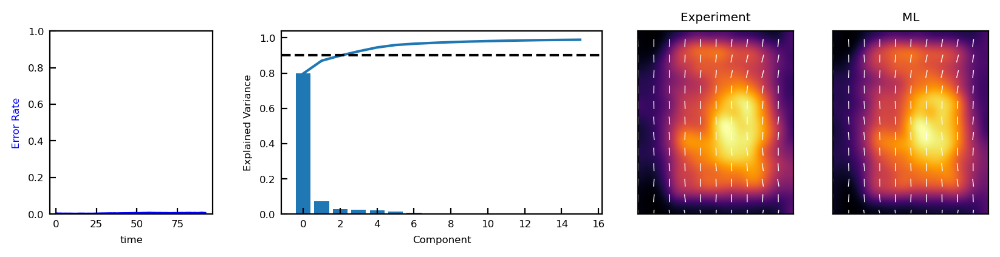

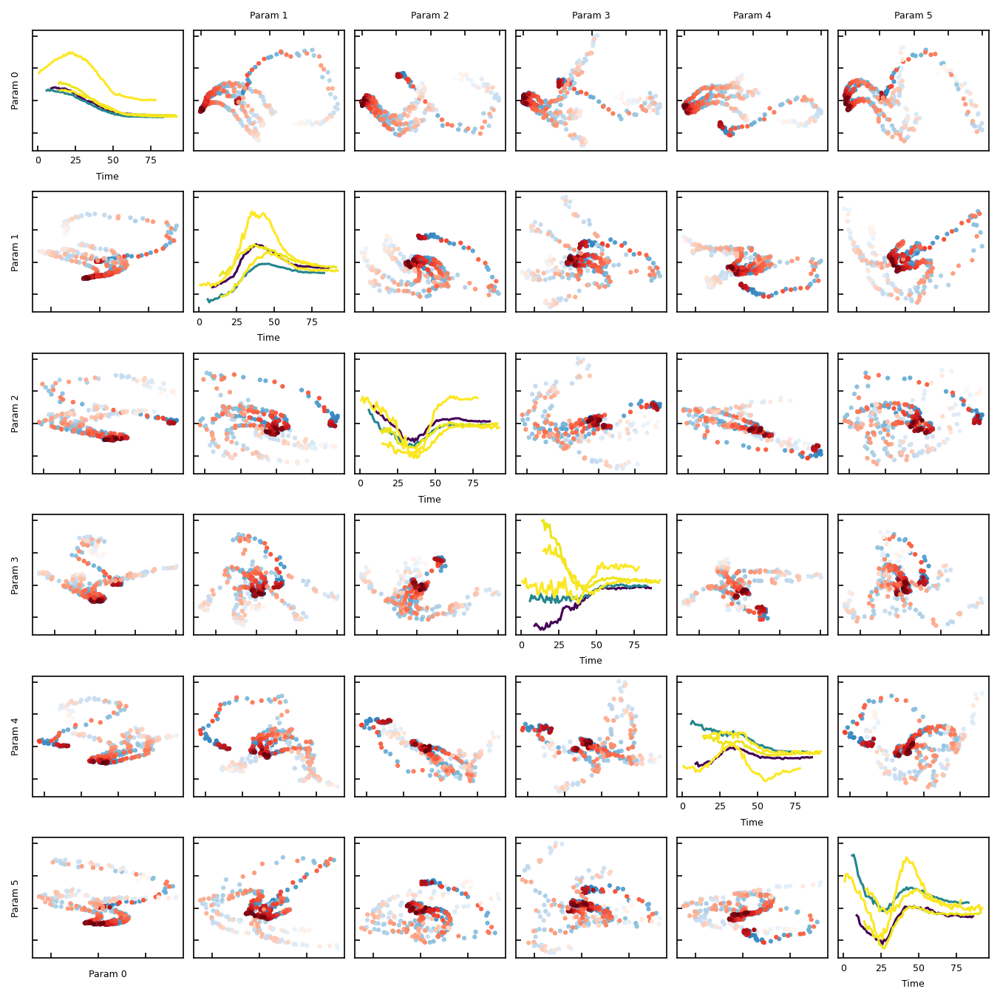

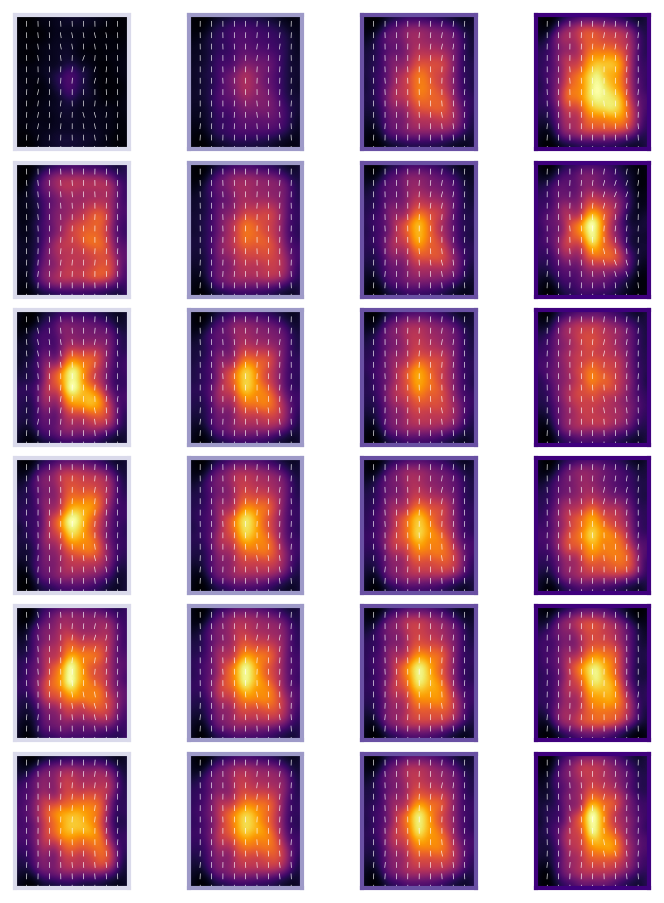

In [6]:
cad_model, cad_df = get_results(cad_dataset, whiten=True)
plot_fn = plot_tensor2D
summary_plot(cad_df, cad_model, cad_dataset, 5, show_magnitude=False)
pca_plots(cad_df, cad_model, cutoff=0.96)

# Fitting components to each other directly

/project/vitelli/ml_venv/lib/python3.7/site-packages/pysindy/optimizers/stlsq.py:195: UserWarning: Sparsity parameter is too big (0.2) and eliminated all coefficients
  "coefficients".format(self.threshold)


v0 = 0.457 m2 + 0.768 m3
v1 = 0.474 m2 + 0.384 m5
v2 = 0.431 m0 + -0.384 m2 + 0.319 m3 + -0.298 m4 + -0.319 m5 + 0.296 m7
v3 = 0.535 m4 + 0.377 m6
v4 = 0.000
Component R^2:  0.33852191309569934
Field Residual:  0.1888640081635252


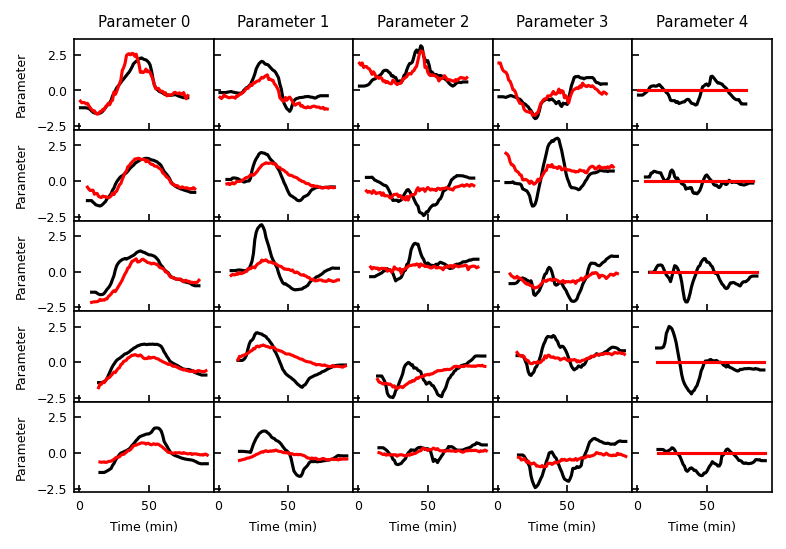

In [9]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
import pysindy as ps

def unpca(d, model, keep):
    if d.shape[1] != model.n_components_:
        di = np.zeros([d.shape[0], keep.shape[0]])
        di[:, keep] = d
        d = di
    d = model.inverse_transform(d)
    d = d.reshape([d.shape[0], -1, 236, 200])
    return d

'''
Step 1. Choose datasets to compare
'''
X_model, X_df = sqh_model, sqh_df.reset_index(drop=True)
y_model, y_df = cvel_model, cvel_df.reset_index(drop=True)

params_X = X_df.filter(like='param', axis=1).values
params_Y = y_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_X = np.cumsum(X_model.explained_variance_ratio_) <= 0.95
keep_y = np.cumsum(y_model.explained_variance_ratio_) <= 0.9

X_train, X_test, y0_train, y0_test = train_test_split(params_X, params_Y, test_size=100)

'''
Step 3. Learn sparse model relating dominant components
'''

model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.2, alpha=10.),
    feature_names=['m%d' % i for i in range(np.sum(keep_X))]
)


model.fit(X_train[:, keep_X], x_dot=y0_train[:, keep_y])
model.print(lhs=['v%d' % i for i in range(np.sum(keep_y))])

y_test = model.predict(X_test[:, keep_X])
print('Component R^2: ', model.score(X_test[:, keep_X], x_dot=y0_test[:, keep_y]))
print('Field Residual: ', residual(unpca(y_test, y_model, keep_y), unpca(y0_test, y_model, keep_y)).mean())

'''
Plot predicted time courses
'''

y_all = model.predict(params_X[:, keep_X])
fig, ax = plt.subplots(len(y_df.embryoID.unique()), y_all.shape[1],
                       sharey='all', sharex='all', dpi=150)

for i, eID in enumerate(y_df.embryoID.unique()):
    data = y_df[y_df.embryoID == eID]
    idx = data.index    
    vals = y_all[idx]
        
    for j in range(y_all.shape[1]):
        ax[i, j].plot(data.time, data['param%d' % j], color='black')
        ax[i, j].plot(data.time, vals[:, j], color='red')
        
        ax[0, j].set_title('Parameter %d' % j)
        ax[-1, j].set_xlabel('Time (min)')
    
    ax[i, 0].set_ylabel('Parameter')
    
fig.subplots_adjust(wspace=0., hspace=0.)

v0 = -0.225 c0 + 0.783 c1
v1 = 0.481 c0 + 0.555 c2 + -0.303 c3
v2 = 0.222 c0 + -0.511 c4
v3 = -0.381 c0
v4 = -0.359 c2 + 0.339 c3 + 0.508 c4
Component R^2:  0.4024813642314046
Field Residual:  0.1737078742934185


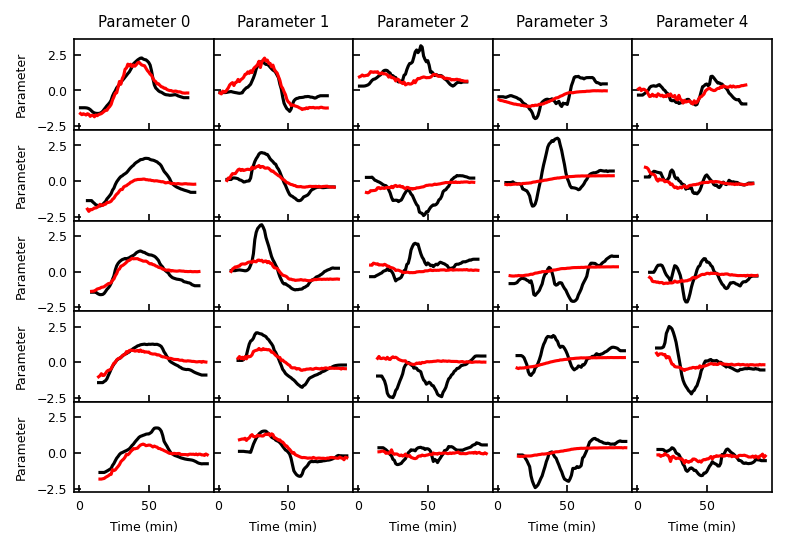

In [10]:
'''
Step 1. Choose datasets to compare
'''
X_model, X_df = cad_model, cad_df.reset_index(drop=True)
y_model, y_df = cvel_model, cvel_df.reset_index(drop=True)

params_X = X_df.filter(like='param', axis=1).values
params_Y = y_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_X = np.cumsum(X_model.explained_variance_ratio_) <= 0.95
keep_y = np.cumsum(y_model.explained_variance_ratio_) <= 0.9

X_train, X_test, y0_train, y0_test = train_test_split(params_X, params_Y, test_size=100)

'''
Step 3. Learn sparse model relating dominant components
'''

model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.2, alpha=10.),
    feature_names=['c%d' % i for i in range(np.sum(keep_X))]
)

model.fit(X_train[:, keep_X], x_dot=y0_train[:, keep_y])
model.print(lhs=['v%d' % i for i in range(np.sum(keep_y))])

y_test = model.predict(X_test[:, keep_X])
print('Component R^2: ', model.score(X_test[:, keep_X], x_dot=y0_test[:, keep_y]))
print('Field Residual: ', residual(unpca(y_test, y_model, keep_y), unpca(y0_test, y_model, keep_y)).mean())

'''
Plot predicted time courses
'''

y_all = model.predict(params_X[:, keep_X])
fig, ax = plt.subplots(len(y_df.embryoID.unique()), y_all.shape[1],
                       sharey='all', sharex='all', dpi=150)

for i, eID in enumerate(y_df.embryoID.unique()):
    data = y_df[y_df.embryoID == eID]
    idx = data.index    
    vals = y_all[idx]
        
    for j in range(y_all.shape[1]):
        ax[i, j].plot(data.time, data['param%d' % j], color='black')
        ax[i, j].plot(data.time, vals[:, j], color='red')
        
        ax[0, j].set_title('Parameter %d' % j)
        ax[-1, j].set_xlabel('Time (min)')
    
    ax[i, 0].set_ylabel('Parameter')
    
fig.subplots_adjust(wspace=0., hspace=0.)

# Tensor dynamics

In [334]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
import pysindy as ps
from pysindy.feature_library.pde_library import PDELibrary

from scipy.io import loadmat
geometry = loadmat('/project/vitelli/jonathan/REDO_fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
XX, YY = geometry['XX'][0, :], geometry['YY'][:, 0]

def unpca(d, model, keep):
    if d.shape[1] != model.n_components_:
        di = np.zeros([d.shape[0], keep.shape[0]])
        di[:, keep] = d
        d = di
    d = model.inverse_transform(d)
    d = d.reshape([d.shape[0], -1, 236, 200])
    return d

'''
Step 1. Choose datasets to use
'''
m_model, m_df = sqh_model, sqh_df.reset_index(drop=True)
c_model, c_df = cad_model, cad_df.reset_index(drop=True)
u_model, u_df = cvel_model, cvel_df.reset_index(drop=True)

params_m = m_df.filter(like='param', axis=1).values
params_c = c_df.filter(like='param', axis=1).values
params_u = u_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_m = np.cumsum(m_model.explained_variance_ratio_) <= 0.95
keep_c = np.cumsum(c_model.explained_variance_ratio_) <= 0.95
keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 0.9

'''
Step 3. Project terms onto subset of meaningful components
'''

M = unpca(params_m[:, keep_m], m_model, keep_m)
C = unpca(params_c[:, keep_c], c_model, keep_c)
U = unpca(params_u[:, keep_u], u_model, keep_u)

'''
Step 4. Compute derivatives and library terms
Terms up to order (N, D) in nonlinearity and derivatives
m (2, 1)
v (1, 1)
c (2, 2)
'''
def pure_tensor_terms(x, d1_x, d2_x=None, key='m'):
    lib = {}
    lib[key] = x
    lib['%s Tr(%s)' % (key, key)] = np.einsum('tkkyx,tijyx->tijyx', x, x)
    
    if d2_x is not None:
        lib['grad^2 %s' % key] = np.einsum('tijyxkk->tijyx', d2_x) # 2. d_{kk} x_{ij}
        lib['grad(div(%s))' % key] = np.einsum('tikyxkj->tijyx', d2_x) # 3. d_{jk} x_{ik}
        lib['grad(grad(Tr(%s))' % key] = np.einsum('tkkyxij->tijyx', d2_x) # 4. d_{ij} x_{kk}
        lib['Tr(%s) grad^2 %s' % (key, key)] = np.einsum('tijyxkk,tllyx->tijyx', d2_x, x) # 5. x_{ll} d_{kk} x_{ij}
        lib['Tr(%s) grad(div(%s))' % (key, key)] = np.einsum('tikyxkj,tllyx->tijyx', d2_x, x) # 6. x_{ll} d_{jk} x_{ik}
        lib['Tr(%s) grad(grad(Tr(%s)))' % (key, key)] = np.einsum('tijyxkk,tllyx->tijyx', d2_x, x) # 7. x_{ll} d_{ij} x_{kk}
        pass
        
    return lib

def pure_vector_terms(u, d1_u):
    lib = {}
    Eij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) + np.einsum('tjyxi->tijyx', d1_u))
    Oij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) - np.einsum('tjyxi->tijyx', d1_u))
    
    lib['vv'] = np.einsum('tiyx,tjyx->tijyx', u, u)
    lib['E'] = Eij
    lib['O'] = Oij

    return lib

def vector_tensor_terms(x, u, d1_x, d1_u, past_lib, key='m'):
    lib = {}
    lib['vv Tr(%s)' % key] = np.einsum('tkkyx,tijyx->tijyx', x, past_lib['vv'])
    lib['v^2 %s' % key] = np.einsum('tkkyx,tijyx->tijyx', past_lib['vv'], x)
    
    vvx = np.einsum('tikyx,tkjyx->tijyx', past_lib['vv'], x)
    xvv = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['vv'])
    lib['(vv%s + %svv)' % (key, key)] = vvx + xvv
    
    lib['Tr(%s) E' % key] = np.einsum('tkkyx,tijyx->tijyx', x, past_lib['E'])
    
    xE = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['E'])
    Ex = np.einsum('tikyx,tkjyx->tijyx', past_lib['E'], x)
    lib['(%sE + E%s)' % (key, key)] = xE + Ex
    
    xO = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['O'])
    Ox = np.einsum('tikyx,tkjyx->tijyx', past_lib['O'], x)
    lib['(%sO - O%s)' % (key, key)] = xO - Ox
    
    
    lib['%s div v' % key] = np.einsum('tijyx,tkyxk->tijyx', x, d1_u)
    lib['v dot grad %s' % key] = np.einsum('tkyx,tijyxk->tijyx', u, d1_x)
    lib['%s (%s dot grad v)' % (key, key)] = np.einsum('tijyx,tklyx,tkyxl->tijyx', x, x, d1_u)
    
    return lib


#Split by embryo
diffT = ps.SmoothedFiniteDifference(d=1, axis=0)
diffY = ps.SmoothedFiniteDifference(d=1, axis=-2)
diffX = ps.SmoothedFiniteDifference(d=1, axis=-1)

tmin = 10
tmax = 70

tmin = 5
tmax = 50

feature_names = None
t = []
x = []
m_dot = []
c_dot = []
m_true = []
c_true = []
u_true = []

for i, eID in tqdm(enumerate(u_df.embryoID.unique())):
    data = u_df[u_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index
    ui = U[idx]

    data = c_df[c_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index
    ci = C[idx].reshape([-1, 2, 2, 236, 200])
    c_dot.append(diffT._differentiate(ci, data.t.values)[..., None])

    
    data = m_df[m_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index
    mi = M[idx].reshape([-1, 2, 2, 236, 200])
    m_dot.append(diffT._differentiate(mi, data.t.values)[..., None])

    t.append(data.t.values)
    
    lib = {}
    
    m_true.append(mi)
    c_true.append(ci)
    u_true.append(ui)
        
    diffY.axis = -2
    diffX.axis = -1
    
    d1_m = np.stack([
        diffY._differentiate(mi, YY),
        diffX._differentiate(mi, XX),
    ], axis=-1)
    
    d1_c = np.stack([
        diffY._differentiate(ci, YY),
        diffX._differentiate(ci, XX),
    ], axis=-1)
    d2_c = np.stack([
        diffY._differentiate(d1_c, YY),
        diffX._differentiate(d1_c, XX),
    ], axis=-1)
    
    diffY.axis = -2
    diffX.axis = -1
    
    d1_u = np.stack([
        diffY._differentiate(ui, YY),
        diffX._differentiate(ui, XX),
    ], axis=-1)
        
    lib = {**lib, **pure_tensor_terms(mi, d1_m, key='m')}
    lib = {**lib, **pure_tensor_terms(ci, d1_c, d2_x=d2_c, key='c')}
    lib = {**lib, **pure_vector_terms(ui, d1_u)}
    lib = {**lib, **vector_tensor_terms(mi, ui, d1_m, d1_u, lib, key='m')}
    lib = {**lib, **vector_tensor_terms(ci, ui, d1_c, d1_u, lib, key='c')}
    
    if 'Oij' in lib:
        lib.pop('Oij')
        
    if feature_names is None:
        feature_names = list(lib.keys())
    
    x.append(np.stack([lib[key] for key in feature_names], axis=-1))
    print(x[-1].shape)

1it [00:10, 10.50s/it]

(45, 2, 2, 236, 200, 31)


2it [00:20, 10.36s/it]

(44, 2, 2, 236, 200, 31)


3it [00:30, 10.02s/it]

(41, 2, 2, 236, 200, 31)


4it [00:38,  9.44s/it]

(36, 2, 2, 236, 200, 31)


5it [00:47,  9.45s/it]

(35, 2, 2, 236, 200, 31)


13.115999999999985


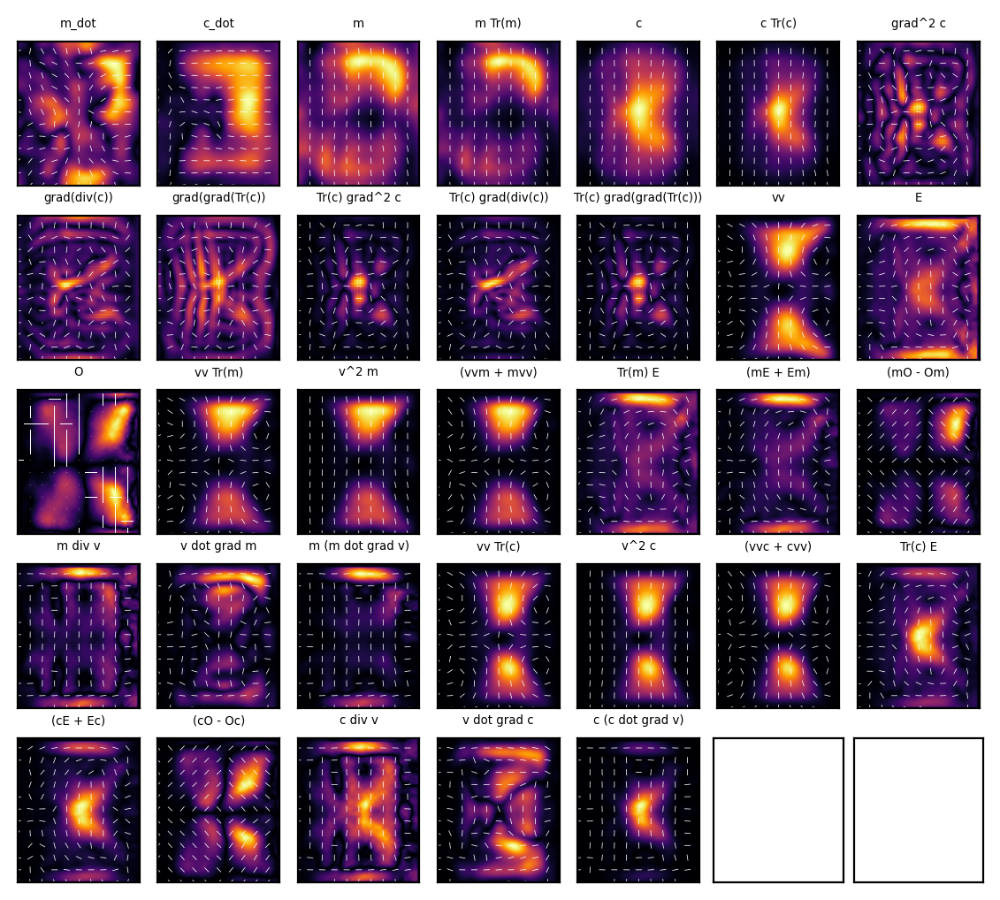

In [335]:
#Show library
from math import ceil
from plot_utils import *

traj = 2
tt = 20
print(times[tt])

ncols = 7
nrows = ceil((x[traj].shape[-1]+2) / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(.8*ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

plt.rcParams['font.size'] = 4

ax[0].set_title('m_dot')
plot_tensor2D(ax[0], m_dot[traj][tt, ..., 0])
ax[1].set_title('c_dot')
plot_tensor2D(ax[1], c_dot[traj][tt, ..., 0])
for i, key in enumerate(feature_names):
    plot_tensor2D(ax[i+2], x[traj][tt, ..., i])
    ax[i+2].set_title(key)

plt.tight_layout()

In [357]:
'''
Step 5. Project library onto PCA basis
'''
def pca_trajectory(x, x_model):
    #x shape [T, C, Y, X, L]
    xi = x.reshape([x.shape[0], -1, *x.shape[-3:]])
    xi = xi.transpose(0, 4, 1, 2, 3) # [T, L, C, Y, X]
    xi= xi.reshape([x.shape[0]*x.shape[-1], -1]) # [T*L, C, Y, X]
    xi = x_model.transform(xi) # [T*L, P]
    xi = xi.reshape([x.shape[0], -1, xi.shape[-1]]) # [T, L, P]
    xi -= np.mean(xi, axis=0, keepdims=True)
    xi = xi.transpose(0, 2, 1) #[T, P, L]
    return xi

keep_m[5:] = False
keep_c[5:] = False

t_min_m, t_max_m = 5, 50
t_min_m, t_max_m = 20, 50
t_min_c, t_max_c = 20, 50

x_pca_m = []
x_pca_c = []

m_dot_pca = []
c_dot_pca = []
for i in range(len(x)):
    t_mask = np.logical_and(t[i] >= t_min_m, t[i] <= t_max_m)
    x_pca_m.append(pca_trajectory(x[i][t_mask], m_model)[:, keep_m])
    m_dot_pca.append(pca_trajectory(m_dot[i][t_mask], m_model)[:, keep_m])
    
    t_mask = np.logical_and(t[i] >= t_min_c, t[i] <= t_max_c)
    x_pca_c.append(pca_trajectory(x[i][t_mask], c_model)[:, keep_c])
    c_dot_pca.append(pca_trajectory(c_dot[i][t_mask], c_model)[:, keep_c])
    print(x[i].shape, x_pca_m[i].shape, m_dot_pca[i].shape, x_pca_c[i].shape, c_dot_pca[i].shape)

(45, 2, 2, 236, 200, 31) (30, 5, 31) (30, 5, 1) (30, 5, 31) (30, 5, 1)
(44, 2, 2, 236, 200, 31) (30, 5, 31) (30, 5, 1) (30, 5, 31) (30, 5, 1)
(41, 2, 2, 236, 200, 31) (30, 5, 31) (30, 5, 1) (30, 5, 31) (30, 5, 1)
(36, 2, 2, 236, 200, 31) (30, 5, 31) (30, 5, 1) (30, 5, 31) (30, 5, 1)
(35, 2, 2, 236, 200, 31) (30, 5, 31) (30, 5, 1) (30, 5, 31) (30, 5, 1)


In [400]:
'''
Step 6. Fit models using SINDy
'''

m_sindy = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=4e-1, alpha=1e-2), #3e-1, 1e-1 on 5->50
    feature_names=feature_names
)
m_sindy.fit(x=x_pca_m, x_dot=m_dot_pca, multiple_trajectories=True)
m_sindy.print(lhs=['(m)\''])

c_sindy = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=1e-1, alpha=1e-1),
    feature_names=feature_names
)
c_sindy.fit(x=x_pca_c, x_dot=c_dot_pca, multiple_trajectories=True)
c_sindy.print(lhs=['(c)\''])


(m)' = -1.013 (mE + Em) + -1.903 (mO - Om) + 1.452 Tr(c) E + -0.804 (cE + Ec) + 0.684 (cO - Oc) + 0.558 v dot grad c
(c)' = -0.369 m Tr(m) + -2.225 (mE + Em) + 6.192 v dot grad m + -2.770 (cO - Oc) + 0.519 v dot grad c


In [401]:
'''
Step 7. Predict
'''
from scipy.interpolate import interp1d
from tqdm import tqdm
    
def evolve_rk4_grid(x0, xdot, pca, t, tmin=0, tmax=10, step_size=0.2):
    tt = np.arange(tmin, tmax, step_size)
    x = np.zeros([len(tt), *x0.shape])
    x[0] = x0
            
    interp = interp1d(t, xdot, axis=0)
    for ii in tqdm(range(len(tt)-1)):
        k1 = interp(tt[ii])
        k2 = interp(tt[ii] + 0.5 * step_size)
        k3 = interp(tt[ii] + 0.5 * step_size)
        k4 = interp(tt[ii] + step_size)
                
        xtt = x[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * step_size / 6
        
        #Project onto PCA components
        xtt = xtt.reshape([1, -1])
        xtt = unpca(pca.transform(xtt)[:, keep_test], pca, keep_test).reshape(x[ii].shape)
        x[ii+1] = xtt

        
    return x, tt

def predict(x, x_dot, x_true, t, traj, sindy, pca):
    t0 = t[traj][0]
    tmax = t[traj][-2]
    
    x_pred = x[traj].reshape([-1, x[traj].shape[-1]])
    x_dot_pred = sindy.model.predict(x_pred)
    x_dot_pred = x_dot_pred.reshape(x_dot[traj].shape)[..., 0]
    
    x_int = interp1d(t[traj], x_true[traj], axis=0)
    ic = x_int(t0)

    x_pred, times = evolve_rk4_grid(ic, x_dot_pred, pca, 
                                    t=t[traj], tmin=t0, tmax=tmax, step_size=0.2)

    return x_pred, x_int, times

traj = 2

m_pred, m_int, times = predict(x, m_dot, m_true, t, traj, m_sindy, m_model)
c_pred, c_int, times = predict(x, c_dot, c_true, t, traj, c_sindy, c_model)
print(m_pred.shape, c_pred.shape, times.shape)

100%|██████████| 194/194 [00:03<00:00, 52.53it/s]

(195, 2, 2, 236, 200) (195, 2, 2, 236, 200) (195,)


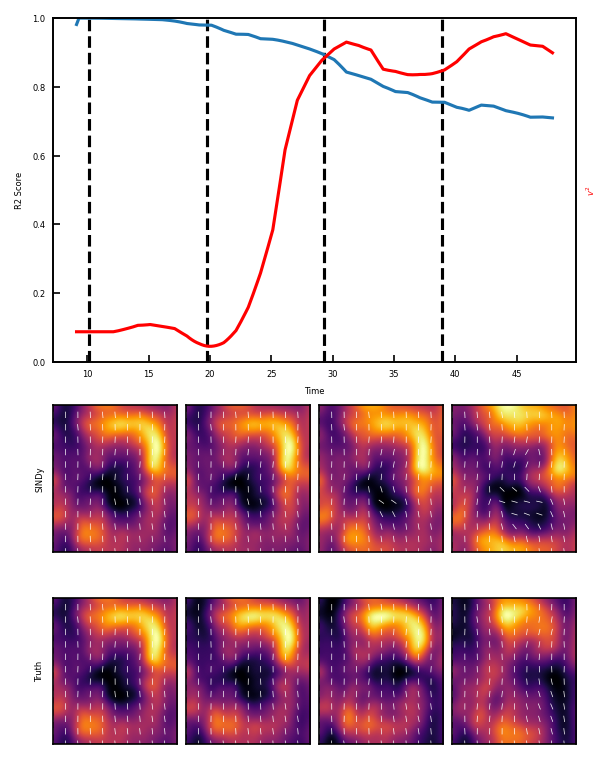

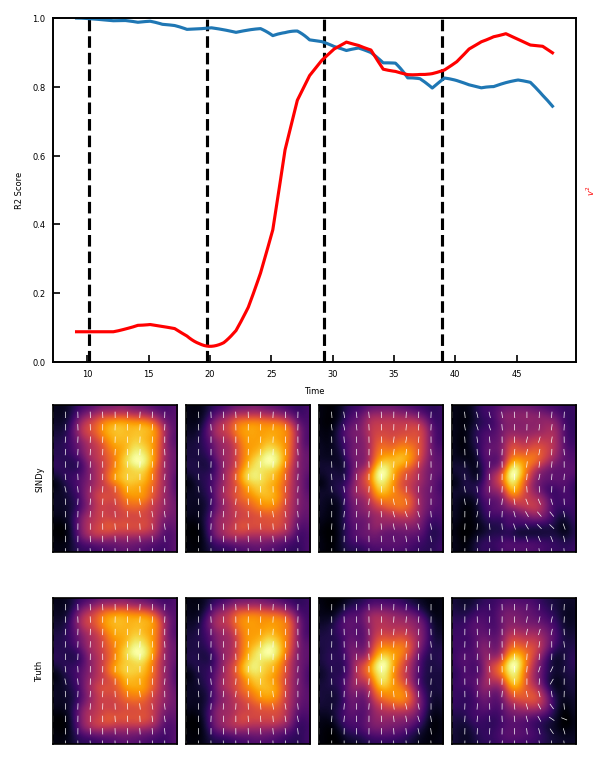

In [402]:
def results_plot(x_pred, x_int, x_model, times):
    ncols = 4
    step = x_pred.shape[0] // ncols

    fig = plt.figure(dpi=150, figsize=(1*ncols, 5))
    gs = fig.add_gridspec(4, ncols)

    plot_fn = color_2D
    ax = fig.add_subplot(gs[:2, :])

    from sklearn.metrics import r2_score

    xi = x_int(times)
    xi = x_model.transform(xi.reshape([times.shape[0], -1]))[:, keep_train]
    xi = unpca(xi, x_model, keep_train)

    error = r2_score(
        x_pred.reshape([x_pred.shape[0], -1]).T,
        xi.reshape([x_pred.shape[0], -1]).T,
        multioutput='raw_values'
    )

    v2 = np.linalg.norm(u_int(times), axis=1).mean(axis=(1, 2))

    ax.plot(times, error)
    ax.set(ylim=[0, 1],
           ylabel='R2 Score',
           xlabel='Time')
    ax2 = ax.twinx()
    ax2.plot(times, v2, color='red')
    ax2.set_yticks([])
    ax2.set_ylabel('$v^2$', color='red')


    offset = 5
    for i in range(ncols):
        ii = i*step + offset
        plot_tensor2D(fig.add_subplot(gs[2, i]), x_pred[ii])
        if i == 0:
            plt.gca().set_ylabel('SINDy')

        plot_tensor2D(fig.add_subplot(gs[3, i]), xi[ii])
        if i == 0:
            plt.gca().set_ylabel('Truth')
        ax.axvline(times[ii], zorder=-1, color='black', linestyle='--')

    plt.tight_layout()

results_plot(m_pred, m_int, m_model, times)
results_plot(c_pred, c_int, c_model, times)

(195, 16)
(195, 16)


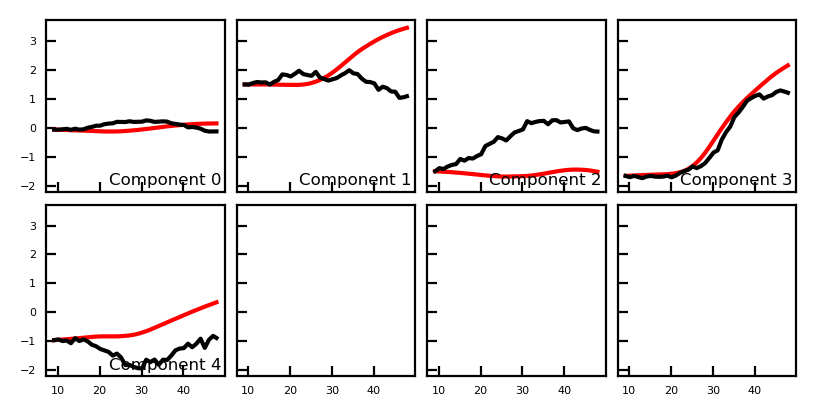

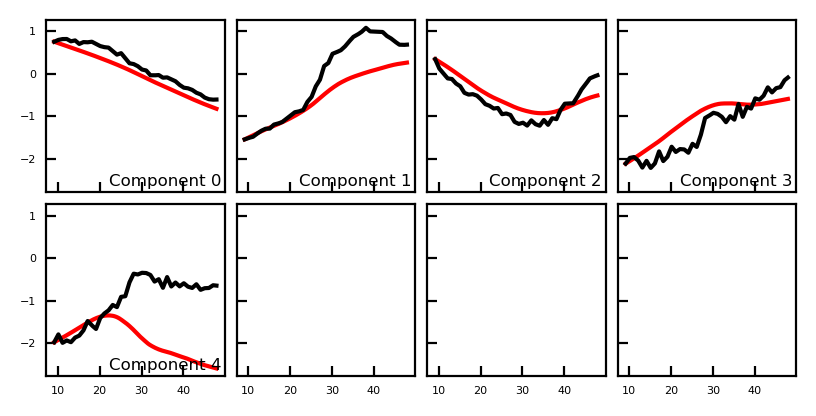

In [349]:
def pca_dynamics_plot(x_pred, x_int, x_model, times):
    pca_pred = x_model.transform(x_pred.reshape([x_pred.shape[0], -1]))
    pca_true = x_model.transform(x_int(times).reshape([pca_pred.shape[0], -1]))

    print(pca_pred.shape)

    pca_pred = pca_pred[:, keep_test]
    pca_true = pca_true[:, keep_test]

    ncols = min(pca_pred.shape[1], 4)
    nrows = ceil(pca_pred.shape[1] / ncols)
    fig, ax = plt.subplots(nrows, ncols, 
                           figsize=(ncols, nrows),
                           sharey=True, sharex=True, dpi=200)
    ax = ax.flatten()

    for i in range(pca_pred.shape[1]):
        ax[i].plot(times, pca_pred[:, i], color='red')
        ax[i].plot(times, pca_true[:, i], color='black')
        ax[i].text(0.98, 0.02, 'Component %d' % i, fontsize=6, 
                   transform=ax[i].transAxes, va='bottom', ha='right')
    plt.tight_layout()
    
pca_dynamics_plot(m_pred, m_int, m_model, times)
pca_dynamics_plot(c_pred, c_int, c_model, times)

# Cadherin dynamics

In [169]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
import pysindy as ps
from pysindy.feature_library.pde_library import PDELibrary

from scipy.io import loadmat
geometry = loadmat('/project/vitelli/jonathan/REDO_fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
XX, YY = geometry['XX'][0, :], geometry['YY'][:, 0]

def unpca(d, model, keep):
    if d.shape[1] != model.n_components_:
        di = np.zeros([d.shape[0], keep.shape[0]])
        di[:, keep] = d
        d = di
    d = model.inverse_transform(d)
    d = d.reshape([d.shape[0], -1, 236, 200])
    return d

'''
Step 1. Choose datasets to use
'''
x_model, x_df = cad_model, cad_df.reset_index(drop=True)
u_model, u_df = cvel_model, cvel_df.reset_index(drop=True)

params_x = x_df.filter(like='param', axis=1).values
params_u = u_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_x = np.cumsum(x_model.explained_variance_ratio_) <= 0.95
keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 0.9

#keep_x = np.cumsum(x_model.explained_variance_ratio_) <= 1.1
#keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 1.1


'''
Step 3. Project terms onto subset of meaningful components
'''

X = unpca(params_x[:, keep_x], x_model, keep_x)
U = unpca(params_u[:, keep_u], u_model, keep_u)

'''
Step 4. Compute derivatives
'''

#Split by embryo
diffT = ps.SmoothedFiniteDifference(d=1, axis=0)
diffY = ps.SmoothedFiniteDifference(d=1, axis=-2)
diffX = ps.SmoothedFiniteDifference(d=1, axis=-1)

tmin = 10
tmax = 70

tmin = 20
tmax = 50


feature_names = [
    'c',
    'c Tr(c)',
    'grad^2 c',
    'grad(div(c))',
    'grad(grad(Tr(c)))',
    'Tr(c) grad^2 c',
    'Tr(c) grad(div(c))',
    'Tr(c) grad(grad(Tr(c)))',
    'v v',
    'E',
    'Tr(c) v v',
    'v^2 c',
     #'v (v dot c)',
    '(v v c + c v v)',
    'Tr(c) E',
    #'c dot E',
    '(c E + E c)',
    '(c O - O c)',
    'c div v',
    'v dot grad c',
    'c (c dot grad v)'
]

t = []
x = []
x_dot = []
x_true = []
u_true = []
for i, eID in enumerate(u_df.embryoID.unique()):
    data = u_df[u_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index

    xi = X[idx].reshape([-1, 2, 2, 236, 200])
    ui = U[idx]
        
    x_dot.append(diffT._differentiate(xi, data.t.values)[..., None])
    t.append(data.t.values)
    lib = []
    
    x_true.append(xi)
    u_true.append(ui)

    '''
    Pure tensor terms
    'm',
    'm Tr(m)',
    'grad^2 m',
    'grad(div(m))',
    'grad(grad(Tr(m)))',
    'Tr(m) grad^2 m',
    'Tr(m) grad(div(m))',
    'Tr(m) grad(grad(Tr(m)))',
    '''
        
    diffY.axis = -2
    diffX.axis = -1
    
    d1_x = np.stack([
        diffY._differentiate(xi, YY),
        diffX._differentiate(xi, XX),
    ], axis=-1)
        
    d2_x = np.stack([
        diffY._differentiate(d1_x, YY),
        diffX._differentiate(d1_x, XX),
    ], axis=-1)
    
    lib.append(xi) # 0. x_{ij}
    lib.append(np.einsum('tkkyx,tijyx->tijyx', xi, xi)) # 1. x_{ij} x_{kk}
    lib.append(np.einsum('tijyxkk->tijyx', d2_x)) # 2. d_{kk} x_{ij}
    lib.append(np.einsum('tikyxkj->tijyx', d2_x)) # 3. d_{jk} x_{ik}
    lib.append(np.einsum('tkkyxij->tijyx', d2_x)) # 4. d_{ij} x_{kk}
    lib.append(np.einsum('tijyxkk,tllyx->tijyx', d2_x, xi)) # 5. x_{ll} d_{kk} x_{ij}
    lib.append(np.einsum('tikyxkj,tllyx->tijyx', d2_x, xi)) # 6. x_{ll} d_{jk} x_{ik}
    lib.append(np.einsum('tijyxkk,tllyx->tijyx', d2_x, xi)) # 7. x_{ll} d_{ij} x_{kk}

    '''
    Pure vector terms
    'v v',
    'E',
    '''
    
    diffY.axis = -2
    diffX.axis = -1
    
    d1_u = np.stack([
        diffY._differentiate(ui, YY),
        diffX._differentiate(ui, XX),
    ], axis=-1)
    
    Eij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) + np.einsum('tjyxi->tijyx', d1_u))
    Oij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) - np.einsum('tjyxi->tijyx', d1_u))
    
    u0 = len(lib)
    lib.append(np.einsum('tiyx,tjyx->tijyx', ui, ui)) # 8. v_i v_j
    lib.append(Eij) # 9. E_{ij}
    
    '''
    Mixed vector tensor terms
    NOTE: any terms with contracted indices between m, v need to be symmetrized
    'Tr(m) v v',
    'v^2 m',
    (v v m + m v v) #since 'v (v dot m)' is not symmetric
    'Tr(m) E',
    (m E + E m) # since 'm dot E' is not symmetric and E is symmetric
    (m O - O m) # since 'm dot O' is not symmetric and O is antisymmetric
    'm div v',
    'v dot grad m',
    'c (c dot grad u)',
    '''
    
    lib.append(np.einsum('tkkyx,tijyx->tijyx', xi, lib[u0])) #10. v_i v_j m_{kk}
    lib.append(np.einsum('tkkyx,tijyx->tijyx', lib[u0], xi)) #11. m_{ij} v_k v_k
    
    vvx = np.einsum('tiyx,tkyx,tkjyx->tijyx', ui, ui, xi)
    xvv = np.einsum('tikyx,tkyx,tjyx->tijyx', xi, ui, ui)
    lib.append(vvx + xvv) # 12. vvm + mvv
    
    lib.append(np.einsum('tkkyx,tijyx->tijyx', xi, lib[u0+1])) #13. m_{kk} E_{ij}
    
    xE = np.einsum('tikyx,tkjyx->tijyx', xi, lib[u0+1])
    Ex = np.einsum('tikyx,tkjyx->tijyx', lib[u0+1], xi)
    lib.append(xE + Ex) # 14. mE + Em
    
    xO = np.einsum('tikyx,tkjyx->tijyx', xi, Oij)
    Ox = np.einsum('tikyx,tkjyx->tijyx', Oij, xi)
    lib.append(xO - Ox) #15. c Omega - Omega c
    
    lib.append(np.einsum('tijyx,tkyxk->tijyx', xi, d1_u))   #17. m_{ij} d_k v_k
    lib.append(np.einsum('tkyx,tijyxk->tijyx', ui, d1_x)) #18. v_k d_k m_{ij}

    lib.append(np.einsum('tijyx,tklyx,tkyxl->tijyx', xi, xi, d1_u)) # 19. c (c dot grad u)
    
    lib = np.stack(lib, axis=-1)
    x.append(lib)
    print(x_dot[-1].shape, x[-1].shape)

(30, 2, 2, 236, 200, 1) (30, 2, 2, 236, 200, 19)
(30, 2, 2, 236, 200, 1) (30, 2, 2, 236, 200, 19)
(30, 2, 2, 236, 200, 1) (30, 2, 2, 236, 200, 19)
(30, 2, 2, 236, 200, 1) (30, 2, 2, 236, 200, 19)
(30, 2, 2, 236, 200, 1) (30, 2, 2, 236, 200, 19)


(30, 236, 200, 20)


,feature,min,max,mean,std
0,c_dot,1.500060e-05,0.124851,0.019028,0.016888
1,c,1.290856e-01,2.060648,0.685558,0.427482
2,c Tr(c),1.996419e-02,5.123905,0.789035,0.930502
3,grad^2 c,7.647609e-07,0.000460,0.000084,0.000062
4,grad(div(c)),9.097888e-07,0.000276,0.000050,0.000033
5,grad(grad(Tr(c))),2.468691e-07,0.000362,0.000089,0.000054
6,Tr(c) grad^2 c,1.992780e-07,0.001057,0.000086,0.000112
7,Tr(c) grad(div(c)),3.490022e-07,0.000437,0.000048,0.000052
8,Tr(c) grad(grad(Tr(c))),1.992780e-07,0.001057,0.000086,0.000112
9,v v,2.162102e-07,101.216554,10.895002,16.272511


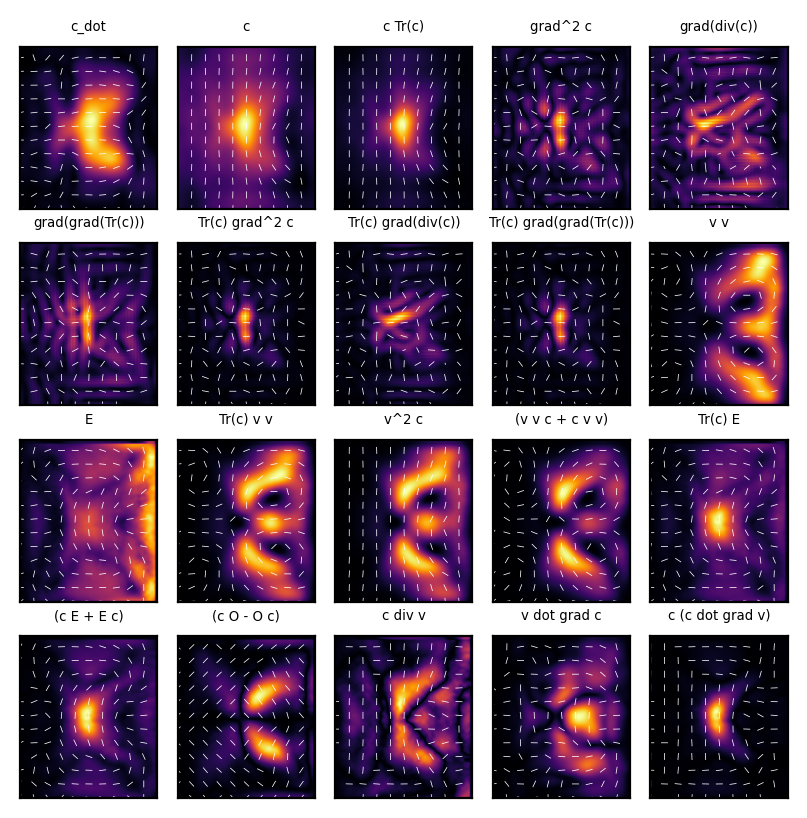

In [170]:
#Show library
from math import ceil

traj = 2
tt = 25

ncols = 5
nrows = ceil((x[traj].shape[-1]+1) / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(.8*ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

plt.rcParams['font.size'] = 4

plot_tensor2D(ax[0], x_dot[traj][tt, ..., 0])
ax[0].set_title('c_dot')
for i in range(x[traj].shape[-1]):
    plot_tensor2D(ax[i+1], x[traj][tt, ..., i])
    ax[i+1].set_title(feature_names[i])

plt.tight_layout()
fnorm = np.linalg.norm(np.concatenate([x_dot[0], x[0]], axis=-1), axis=(1, 2))
print(fnorm.shape)

df = pd.DataFrame({
    'feature': ['c_dot',] + feature_names,
    'min': np.min(fnorm, axis=(0, 1, 2)),
    'max': np.max(fnorm, axis=(0, 1, 2)),
    'mean': np.mean(fnorm, axis=(0, 1, 2)),
    'std': np.std(fnorm, axis=(0, 1, 2)),
})
df

In [171]:
'''
Step 5. Project library onto PCA basis
'''
def pca_trajectory(x):
    #x shape [T, C, Y, X, L] where L = Library size
    xi = x.reshape([x.shape[0], -1, *x.shape[-3:]])
    xi = xi.transpose(0, 4, 1, 2, 3) # [T, L, C, Y, X]
    xi= xi.reshape([x.shape[0]*x.shape[-1], -1]) # [T*L, C, Y, X]
    xi = x_model.transform(xi) # [T*L, P]
    xi = xi.reshape([x.shape[0], -1, xi.shape[-1]]) # [T, L, P]
    xi -= np.mean(xi, axis=0, keepdims=True)
    xi = xi.transpose(0, 2, 1) #[T, P, L]
    return xi

keep_train = np.zeros(x_model.n_components_, dtype=bool)
keep_test = np.zeros(x_model.n_components_, dtype=bool)

keep_train[:4] = True #We want to train on the meaningful dynamics
keep_test[:4] = True   #We want to test on all meaningful components

x_pca = []
x_dot_pca = []
for i in range(len(x)):
    x_pca.append(pca_trajectory(x[i])[:, keep_train])
    x_dot_pca.append(pca_trajectory(x_dot[i])[:, keep_train])
    print(x[i].shape, x_pca[i].shape, x_dot_pca[i].shape)

(30, 2, 2, 236, 200, 19) (30, 4, 19) (30, 4, 1)
(30, 2, 2, 236, 200, 19) (30, 4, 19) (30, 4, 1)
(30, 2, 2, 236, 200, 19) (30, 4, 19) (30, 4, 1)
(30, 2, 2, 236, 200, 19) (30, 4, 19) (30, 4, 1)
(30, 2, 2, 236, 200, 19) (30, 4, 19) (30, 4, 1)


In [174]:
'''
Step 6. Preprocess data with Standard Scaler
'''
from sklearn.preprocessing import StandardScaler

def get_scaled_coefficients(model, X_scaler, y0_scaler):
    coef = y0_scaler.scale_ * model.model.steps[-1][1].coef_ / X_scaler.scale_
    intercept = y0_scaler.mean_ + y0_scaler.scale_ * model.model.steps[-1][1].intercept_ - \
        np.sum(coef * X_scaler.mean_)
    return coef, intercept

def equation_string(coef, intercept, feature_names, rhs='x_dot', precision=3):
    int_mean = np.mean(intercept)
    int_err = np.std(intercept)
        
    coef_mean = np.mean(coef, axis=(0))
    coef_err = np.std(coef, axis=(0))
        
    eqn = ps.utils.print_model(
        coef_mean, feature_names,
        intercept=int_mean,
        #errors=coef_err,
        #error_intercept=int_err,
        precision=precision,
    )
    
    return r'%s = %s' % (rhs, eqn)

def scale(x):
    scaler = StandardScaler().fit(np.concatenate(x, axis=0).reshape([-1, x[0].shape[-1]]))
    scaled = [scaler.transform(xp.reshape([-1, xp.shape[-1]])).reshape(xp.shape) for xp in x]
    return scaler, scaled

x_scaler, x_scaled = scale(x_pca)
x_dot_scaler, x_dot_scaled = scale(x_dot_pca)

'''
Step 7. Fit model using SINDy
'''

model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.25, alpha=.1),
    feature_names=feature_names
)

use_scale=True
if use_scale:
    X = x_scaled
    X_dot = x_dot_scaled
else:
    X = x_pca
    X_dot = x_dot_pca

model.fit(x=X, x_dot=X_dot, multiple_trajectories=True)

if use_scale:
    coef, intercept = get_scaled_coefficients(model, x_scaler, x_dot_scaler)
    print(equation_string(coef, intercept, feature_names, rhs='(m)\''))
else:
    model.print()
    
'''
Step 8. Predict
'''
from scipy.interpolate import interp1d
from tqdm import tqdm

def evolve_rk4_grid(x0, xdot, pca, t, tmin=0, tmax=10, step_size=0.2):
    tt = np.arange(tmin, tmax, step_size)
    x = np.zeros([len(tt), *x0.shape])
    x[0] = x0
            
    interp = interp1d(t, xdot, axis=0)
    for ii in tqdm(range(len(tt)-1)):
        k1 = interp(tt[ii])
        k2 = interp(tt[ii] + 0.5 * step_size)
        k3 = interp(tt[ii] + 0.5 * step_size)
        k4 = interp(tt[ii] + step_size)
                
        xtt = x[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * step_size / 6
        
        #Project onto PCA components
        xtt = xtt.reshape([1, -1])
        xtt = unpca(pca.transform(xtt)[:, keep_test], pca, keep_test).reshape(x[ii].shape)
        x[ii+1] = xtt

        
    return x, tt

traj = 2

t0 = t[traj][0]
tmax = t[traj][-2]

#Predict and unscale
x_pred = x[traj].reshape([-1, x[traj].shape[-1]])
if use_scale: x_pred = x_scaler.transform(x_pred)
x_dot_pred = model.model.predict(x_pred)
if use_scale: x_dot_pred = x_dot_scaler.inverse_transform(x_dot_pred)
x_dot_pred = x_dot_pred.reshape(x_dot[traj].shape)[..., 0]

x_int = interp1d(t[traj], x_true[traj], axis=0)
u_int = interp1d(t[traj], u_true[traj], axis=0)
ic = x_int(t0)

x_pred, times = evolve_rk4_grid(ic, x_dot_pred, x_model, 
                                t=t[traj], tmin=t0, tmax=tmax, step_size=0.2)
print(x_pred.shape, times.shape)

(m)' = 0.034 c Tr(c) + -949.168 grad^2 c + 6743.797 grad(div(c)) + -2702.854 grad(grad(Tr(c))) + 383.123 Tr(c) grad^2 c + -2522.885 Tr(c) grad(div(c)) + 383.123 Tr(c) grad(grad(Tr(c))) + 0.002 v v + 1.500 E + 0.006 Tr(c) v v + 0.005 v^2 c + -0.007 (v v c + c v v) + -4.971 Tr(c) E + 2.283 (c E + E c) + -4.921 (c O - O c) + -1.944 c div v + 0.628 c (c dot grad v)


100%|██████████| 139/139 [00:02<00:00, 49.03it/s]

(140, 2, 2, 236, 200) (140,)


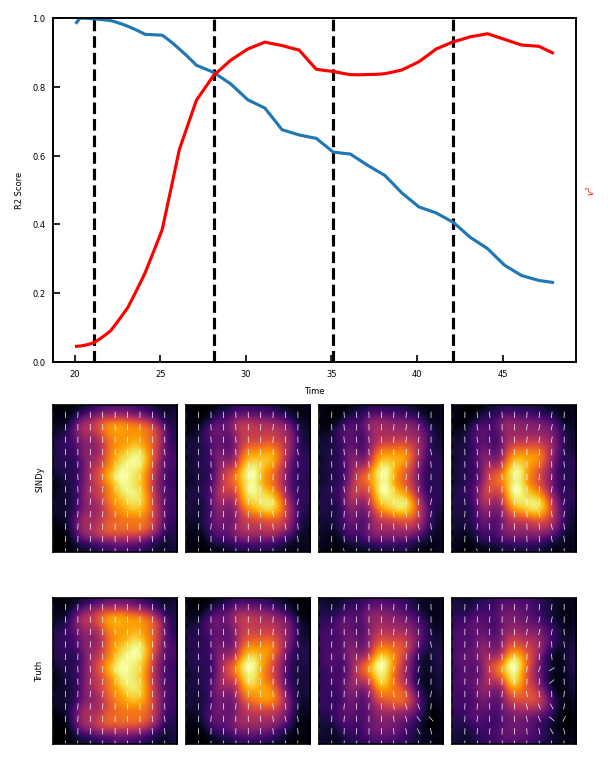

In [175]:
ncols = 4
step = x_pred.shape[0] // ncols

fig = plt.figure(dpi=150, figsize=(1*ncols, 5))
gs = fig.add_gridspec(4, ncols)

plot_fn = color_2D
ax = fig.add_subplot(gs[:2, :])

from sklearn.metrics import r2_score

xi = x_int(times)
xi = x_model.transform(xi.reshape([times.shape[0], -1]))[:, keep_train]
xi = unpca(xi, x_model, keep_train)

error = r2_score(
    x_pred.reshape([x_pred.shape[0], -1]).T,
    xi.reshape([x_pred.shape[0], -1]).T,
    multioutput='raw_values'
)

v2 = np.linalg.norm(u_int(times), axis=1).mean(axis=(1, 2))

ax.plot(times, error)
ax.set(ylim=[0, 1],
       ylabel='R2 Score',
       xlabel='Time')
ax2 = ax.twinx()
ax2.plot(times, v2, color='red')
ax2.set_yticks([])
ax2.set_ylabel('$v^2$', color='red')


offset = 5
for i in range(ncols):
    ii = i*step + offset
    plot_tensor2D(fig.add_subplot(gs[2, i]), x_pred[ii])
    if i == 0:
        plt.gca().set_ylabel('SINDy')

    plot_tensor2D(fig.add_subplot(gs[3, i]), xi[ii])
    if i == 0:
        plt.gca().set_ylabel('Truth')
    ax.axvline(times[ii], zorder=-1, color='black', linestyle='--')
    
plt.tight_layout()

(140, 16)


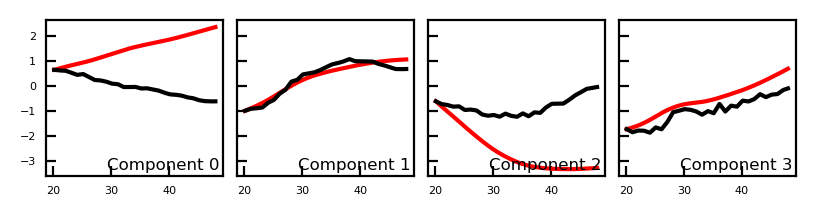

In [133]:
pca_pred = x_model.transform(x_pred.reshape([x_pred.shape[0], -1]))
pca_true = x_model.transform(x_int(times).reshape([pca_pred.shape[0], -1]))

print(pca_pred.shape)

pca_pred = pca_pred[:, keep_test]
pca_true = pca_true[:, keep_test]

ncols = min(pca_pred.shape[1], 4)
nrows = ceil(pca_pred.shape[1] / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

for i in range(pca_pred.shape[1]):
    ax[i].plot(times, pca_pred[:, i], color='red')
    ax[i].plot(times, pca_true[:, i], color='black')
    ax[i].text(0.98, 0.02, 'Component %d' % i, fontsize=6, 
               transform=ax[i].transAxes, va='bottom', ha='right')
plt.tight_layout()

# Myosin dynamics

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
import pysindy as ps
from pysindy.feature_library.pde_library import PDELibrary

from scipy.io import loadmat
geometry = loadmat('/project/vitelli/jonathan/REDO_fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
XX, YY = geometry['XX'][0, :], geometry['YY'][:, 0]

def unpca(d, model, keep):
    if d.shape[1] != model.n_components_:
        di = np.zeros([d.shape[0], keep.shape[0]])
        di[:, keep] = d
        d = di
    d = model.inverse_transform(d)
    d = d.reshape([d.shape[0], -1, 236, 200])
    return d

'''
Step 1. Choose datasets to use
'''
x_model, x_df = sqh_model, sqh_df.reset_index(drop=True)
u_model, u_df = cvel_model, cvel_df.reset_index(drop=True)
c_model, c_df = cad_model, cad_df.reset_index(drop=True) #Control is cadherin dataset

params_x = x_df.filter(like='param', axis=1).values
params_u = u_df.filter(like='param', axis=1).values
params_c = c_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_x = np.cumsum(x_model.explained_variance_ratio_) <= 0.95
keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 0.9
keep_c = np.cumsum(c_model.explained_variance_ratio_) <= 0.95

'''
Step 3. Project terms onto subset of meaningful components
'''

X = unpca(params_x[:, keep_x], x_model, keep_x)
U = unpca(params_u[:, keep_u], u_model, keep_u)
C = unpca(params_c[:, keep_c], c_model, keep_c)

'''
Step 4. Compute derivatives and library terms
Terms up to order (N, D) in nonlinearity and derivatives
m (2, 1)
v (1, 1)
c (2, 2)
'''
def pure_tensor_terms(x, d1_x, d2_x=None, key='m'):
    lib = {}
    lib[key] = x
    lib['%s Tr(%s)' % (key, key)] = np.einsum('tkkyx,tijyx->tijyx', x, x)
    
    if d2_x is not None:
        #lib.append(np.einsum('tijyxkk->tijyx', d2_x)) # 2. d_{kk} x_{ij}
        #lib.append(np.einsum('tikyxkj->tijyx', d2_x)) # 3. d_{jk} x_{ik}
        #lib.append(np.einsum('tkkyxij->tijyx', d2_x)) # 4. d_{ij} x_{kk}
        #lib.append(np.einsum('tijyxkk,tllyx->tijyx', d2_x, xi)) # 5. x_{ll} d_{kk} x_{ij}
        #lib.append(np.einsum('tikyxkj,tllyx->tijyx', d2_x, xi)) # 6. x_{ll} d_{jk} x_{ik}
        #lib.append(np.einsum('tijyxkk,tllyx->tijyx', d2_x, xi)) # 7. x_{ll} d_{ij} x_{kk}
        pass
        
    return lib

def pure_vector_terms(u, d1_u):
    lib = {}
    Eij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) + np.einsum('tjyxi->tijyx', d1_u))
    Oij = 0.5 * (np.einsum('tiyxj->tijyx', d1_u) - np.einsum('tjyxi->tijyx', d1_u))
    
    lib['vv'] = np.einsum('tiyx,tjyx->tijyx', u, u)
    lib['Eij'] = Eij
    lib['Oij'] = Oij

    return lib

def vector_tensor_terms(x, u, d1_x, d1_u, past_lib, key='m'):
    '''
    Mixed vector tensor terms
    NOTE: any terms with contracted indices between m, v need to be symmetrized
    'Tr(m) v v',
    'v^2 m',
    (v v m + m v v) #since 'v (v dot m)' is not symmetric
    'Tr(m) E',
    (m E + E m) # since 'm dot E' is not symmetric and E is symmetric
    (m O - O m) # since 'm dot O' is not symmetric and O is antisymmetric
    'm div v',
    'v dot grad m',
    'c (c dot grad u)',
    '''
    lib = {}
    lib['vv Tr(%s)' % key] = np.einsum('tkkyx,tijyx->tijyx', x, past_lib['vv'])
    lib['v^2 %s' % key] = np.einsum('tkkyx,tijyx->tijyx', past_lib['vv'], x)
    
    vvx = np.einsum('tikyx,tkjyx->tijyx', past_lib['vv'], x)
    xvv = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['vv'])
    lib['(vv%s + %svv)' % (key, key)] = vvx + xvv
    
    lib['Tr(%s) E' % key] = np.einsum('tkkyx,tijyx->tijyx', x, past_lib['Eij'])
    
    
    xE = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['Eij'])
    Ex = np.einsum('tikyx,tkjyx->tijyx', past_lib['Eij'], x)
    lib['(%sE + E%s)' % (key, key)] = xE + Ex
    
    xO = np.einsum('tikyx,tkjyx->tijyx', x, past_lib['Oij'])
    Ox = np.einsum('tikyx,tkjyx->tijyx', past_lib['Oij'], x)
    lib['(%sO - O%s)' % (key, key)] = xO - Ox
    
    
    lib['%s div v' % key] = np.einsum('tijyx,tkyxk->tijyx', x, d1_u)
    lib['v dot grad %s' % key] = np.einsum('tkyx,tijyxk->tijyx', u, d1_x)
    lib['%s (%s dot grad v)' % (key, key)] = np.einsum('tijyx,tklyx,tkyxl->tijyx', xi, xi, d1_u)
    
    return lib


#Split by embryo
diffT = ps.SmoothedFiniteDifference(d=1, axis=0)
diffY = ps.SmoothedFiniteDifference(d=1, axis=-2)
diffX = ps.SmoothedFiniteDifference(d=1, axis=-1)

tmin = 10
tmax = 70

tmin = 5
tmax = 50

feature_names = None
t = []
x = []
x_dot = []
x_true = []
u_true = []

for i, eID in tqdm(enumerate(u_df.embryoID.unique())):
    data = u_df[u_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index

    xi = X[idx].reshape([-1, 2, 2, 236, 200])
    ci = C[idx].reshape([-1, 2, 2, 236, 200])
    ui = U[idx]
        
    x_dot.append(diffT._differentiate(xi, data.t.values)[..., None])
    t.append(data.t.values)
    lib = {}
    
    x_true.append(xi)
    u_true.append(ui)
        
    diffY.axis = -2
    diffX.axis = -1
    
    d1_x = np.stack([
        diffY._differentiate(xi, YY),
        diffX._differentiate(xi, XX),
    ], axis=-1)
    
    d1_c = np.stack([
        diffY._differentiate(ci, YY),
        diffX._differentiate(ci, XX),
    ], axis=-1)
    
    
    diffY.axis = -2
    diffX.axis = -1
    
    d1_u = np.stack([
        diffY._differentiate(ui, YY),
        diffX._differentiate(ui, XX),
    ], axis=-1)
        
    lib = {**lib, **pure_tensor_terms(xi, d1_x, key='m')}
    lib = {**lib, **pure_vector_terms(ui, d1_u)}
    lib = {**lib, **vector_tensor_terms(xi, ui, d1_x, d1_u, lib, key='m')}
    lib = {**lib, **pure_tensor_terms(ci, d1_c, key='c')}
    
    if 'Oij' in lib:
        lib.pop('Oij')
        
    if feature_names is None:
        feature_names = list(lib.keys())
    
    x.append(np.stack([lib[key] for key in feature_names], axis=-1))
    print(x[-1].shape, x_dot[-1].shape)

1it [00:04,  4.40s/it]

(45, 2, 2, 236, 200, 15) (45, 2, 2, 236, 200, 1)


2it [00:08,  4.35s/it]

(44, 2, 2, 236, 200, 15) (44, 2, 2, 236, 200, 1)


3it [00:12,  4.22s/it]

(41, 2, 2, 236, 200, 15) (41, 2, 2, 236, 200, 1)


4it [00:16,  3.97s/it]

(36, 2, 2, 236, 200, 15) (36, 2, 2, 236, 200, 1)


5it [00:19,  3.97s/it]

(35, 2, 2, 236, 200, 15) (35, 2, 2, 236, 200, 1)


13.115999999999985
(45, 236, 200, 16)


,feature,min,max,mean,std
0,c_dot,1.679418e-05,0.038948,0.003499,0.002990
1,m,5.632313e-02,0.451020,0.188642,0.075819
2,m Tr(m),4.018118e-03,0.241335,0.049819,0.039982
3,vv,2.162102e-07,101.216554,7.352727,14.201018
4,Eij,0.000000e+00,0.121939,0.017608,0.018447
5,vv Tr(m),3.368673e-08,23.913816,1.552890,3.019125
6,v^2 m,2.916290e-08,20.343859,1.255212,2.453173
7,(vvm + mvv),3.105202e-08,40.016761,1.810553,3.959080
8,Tr(m) E,0.000000e+00,0.023508,0.003659,0.003651
9,(mE + Em),0.000000e+00,0.034792,0.003980,0.004572


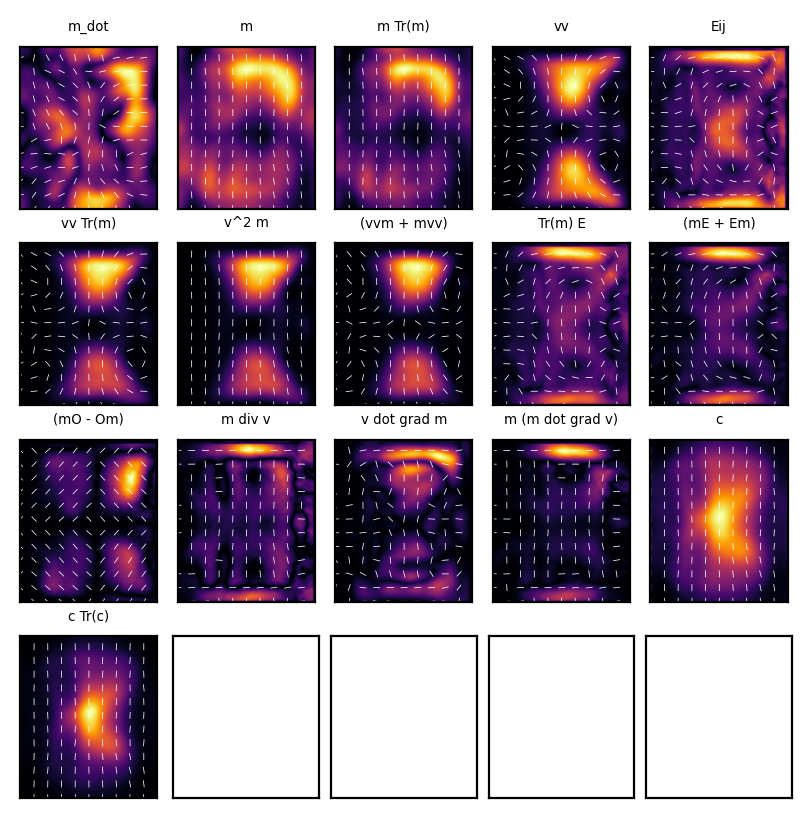

In [ ]:
#Show library
from math import ceil
from plot_utils import *

traj = 2
tt = 20
print(times[tt])

ncols = 5
nrows = ceil((x[traj].shape[-1]+1) / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(.8*ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

plt.rcParams['font.size'] = 4

plot_tensor2D(ax[0], x_dot[traj][tt, ..., 0])
ax[0].set_title('m_dot')
for i, key in enumerate(feature_names):
    plot_tensor2D(ax[i+1], x[traj][tt, ..., i])
    ax[i+1].set_title(key)

plt.tight_layout()

fnorm = np.linalg.norm(np.concatenate([x_dot[0], x[0]], axis=-1), axis=(1, 2))
print(fnorm.shape)

df = pd.DataFrame({
    'feature': ['c_dot',] + feature_names,
    'min': np.min(fnorm, axis=(0, 1, 2)),
    'max': np.max(fnorm, axis=(0, 1, 2)),
    'mean': np.mean(fnorm, axis=(0, 1, 2)),
    'std': np.std(fnorm, axis=(0, 1, 2)),
})
df

In [ ]:
'''
Step 5. Project library onto PCA basis
'''
def pca_trajectory(x):
    #x shape [T, C, Y, X, L]
    xi = x.reshape([x.shape[0], -1, *x.shape[-3:]])
    xi = xi.transpose(0, 4, 1, 2, 3) # [T, L, C, Y, X]
    xi= xi.reshape([x.shape[0]*x.shape[-1], -1]) # [T*L, C, Y, X]
    xi = x_model.transform(xi) # [T*L, P]
    xi = xi.reshape([x.shape[0], -1, xi.shape[-1]]) # [T, L, P]
    xi -= np.mean(xi, axis=0, keepdims=True)
    xi = xi.transpose(0, 2, 1) #[T, P, L]
    return xi

keep_train = np.zeros(x_model.n_components_, dtype=bool)
keep_test = np.zeros(x_model.n_components_, dtype=bool)

keep_train[:5] = True #We want to train on the meaningful dynamics
keep_test[:5] = True   #We want to test on all meaningful components

x_pca = []
x_dot_pca = []
for i in range(len(x)):
    x_pca.append(pca_trajectory(x[i])[:, keep_train])
    x_dot_pca.append(pca_trajectory(x_dot[i])[:, keep_train])
    print(x[i].shape, x_pca[i].shape)

(45, 2, 2, 236, 200, 15) (45, 5, 15)
(44, 2, 2, 236, 200, 15) (44, 5, 15)
(41, 2, 2, 236, 200, 15) (41, 5, 15)
(36, 2, 2, 236, 200, 15) (36, 5, 15)
(35, 2, 2, 236, 200, 15) (35, 5, 15)


In [ ]:
'''
Step 6. Preprocess data with Standard Scaler
'''
from sklearn.preprocessing import StandardScaler

def get_scaled_coefficients(model, X_scaler, y0_scaler):
    coef = y0_scaler.scale_ * model.model.steps[-1][1].coef_ / X_scaler.scale_
    intercept = y0_scaler.mean_ + y0_scaler.scale_ * model.model.steps[-1][1].intercept_ - \
        np.sum(coef * X_scaler.mean_)
    return coef, intercept

def equation_string(coef, intercept, feature_names, rhs='x_dot', precision=3):
    int_mean = np.mean(intercept)
    int_err = np.std(intercept)
        
    coef_mean = np.mean(coef, axis=(0))
    coef_err = np.std(coef, axis=(0))
        
    eqn = ps.utils.print_model(
        coef_mean, feature_names,
        intercept=int_mean,
        precision=precision,
    )
    
    return r'%s = %s' % (rhs, eqn)

def scale(x):
    scaler = StandardScaler().fit(np.concatenate(x, axis=0).reshape([-1, x[0].shape[-1]]))
    scaled = [scaler.transform(xp.reshape([-1, xp.shape[-1]])).reshape(xp.shape) for xp in x]
    return scaler, scaled

x_scaler, x_scaled = scale(x_pca)
x_dot_scaler, x_dot_scaled = scale(x_dot_pca)

'''
Step 7. Fit model using SINDy
'''

model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.1, alpha=.1),
    feature_names=feature_names
)

use_scale=False
if use_scale:
    X = x_scaled
    X_dot = x_dot_scaled
else:
    X = x_pca
    X_dot = x_dot_pca

model.fit(x=X, x_dot=X_dot, multiple_trajectories=True)

if use_scale:
    coef, intercept = get_scaled_coefficients(model, x_scaler, x_dot_scaler)
    print(equation_string(coef, intercept, feature_names, rhs='(m)\''))
else:
    model.print()

(m)' = 1.175 Tr(m) E + -1.092 (mE + Em) + -1.492 (mO - Om) + -0.973 m div v + 0.945 v dot grad m


 54%|█████▍    | 105/194 [00:02<00:01, 53.29it/s] 51%|█████     | 99/194 [00:01<00:01, 53.26it/s] 48%|████▊     | 93/194 [00:01<00:01, 53.25it/s] 45%|████▍     | 87/194 [00:01<00:02, 53.04it/s] 42%|████▏     | 81/194 [00:01<00:02, 52.87it/s] 39%|███▊      | 75/194 [00:01<00:02, 52.64it/s] 36%|███▌      | 69/194 [00:01<00:02, 52.29it/s] 32%|███▏      | 63/194 [00:01<00:02, 53.26it/s] 29%|██▉       | 57/194 [00:01<00:02, 53.19it/s] 26%|██▋       | 51/194 [00:01<00:02, 52.98it/s] 23%|██▎       | 45/194 [00:00<00:02, 52.59it/s] 20%|██        | 39/194 [00:00<00:02, 52.23it/s] 17%|█▋        | 33/194 [00:00<00:03, 51.42it/s] 14%|█▍        | 27/194 [00:00<00:03, 50.44it/s] 11%|█         | 21/194 [00:00<00:03, 48.86it/s]  8%|▊         | 15/194 [00:00<00:03, 46.13it/s]  5%|▌         | 10/194 [00:00<00:04, 44.62it/s]  2%|▏         | 4/194 [00:00<00:05, 33.14it/s]  0%|          | 0/194 [00:00<?, ?it/s] 87%|████████▋ | 168/194 [00:03<00:00, 54.32it/s] 84%|████████▎ | 162/194 [00:03<00:00, 54.26it/s

In [ ]:
'''
Step 8. Predict
'''
from scipy.interpolate import interp1d
from tqdm import tqdm

def evolve_rk4_grid(x0, xdot, pca, t, tmin=0, tmax=10, step_size=0.2):
    tt = np.arange(tmin, tmax, step_size)
    x = np.zeros([len(tt), *x0.shape])
    x[0] = x0
            
    interp = interp1d(t, xdot, axis=0)
    for ii in tqdm(range(len(tt)-1)):
        k1 = interp(tt[ii])
        k2 = interp(tt[ii] + 0.5 * step_size)
        k3 = interp(tt[ii] + 0.5 * step_size)
        k4 = interp(tt[ii] + step_size)
                
        xtt = x[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * step_size / 6
        
        #Project onto PCA components
        xtt = xtt.reshape([1, -1])
        xtt = unpca(pca.transform(xtt)[:, keep_test], pca, keep_test).reshape(x[ii].shape)
        x[ii+1] = xtt

        
    return x, tt

traj = 2

t0 = t[traj][0]
tmax = t[traj][-2]

#Predict and unscale
x_pred = x[traj].reshape([-1, x[traj].shape[-1]])
if use_scale: x_pred = x_scaler.transform(x_pred)
x_dot_pred = model.model.predict(x_pred)
if use_scale: x_dot_pred = x_dot_scaler.inverse_transform(x_dot_pred)
x_dot_pred = x_dot_pred.reshape(x_dot[traj].shape)[..., 0]

x_int = interp1d(t[traj], x_true[traj], axis=0)
u_int = interp1d(t[traj], u_true[traj], axis=0)
ic = x_int(t0)

x_pred, times = evolve_rk4_grid(ic, x_dot_pred, x_model, 
                                t=t[traj], tmin=t0, tmax=tmax, step_size=0.2)
print(x_pred.shape, times.shape)

100%|██████████| 194/194 [00:03<00:00, 53.80it/s]

(195, 2, 2, 236, 200) (195,)


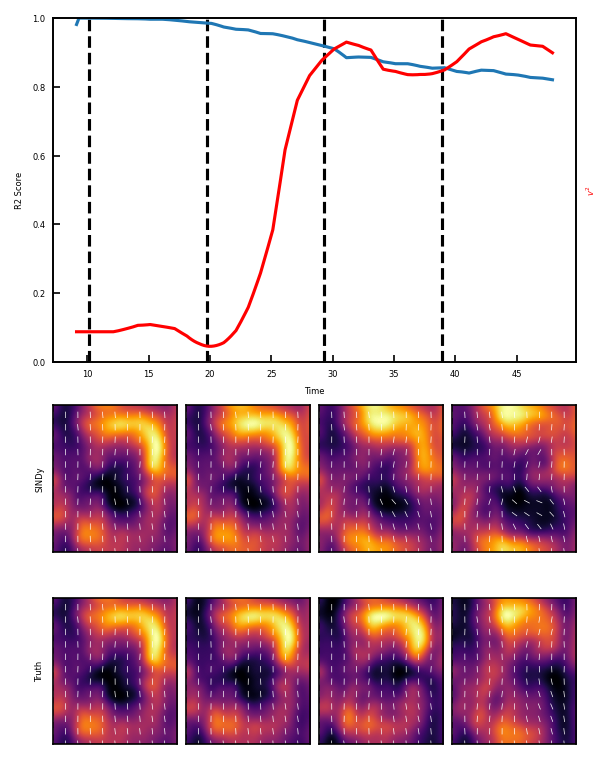

In [ ]:
ncols = 4
step = x_pred.shape[0] // ncols

fig = plt.figure(dpi=150, figsize=(1*ncols, 5))
gs = fig.add_gridspec(4, ncols)

plot_fn = color_2D
ax = fig.add_subplot(gs[:2, :])

from sklearn.metrics import r2_score

xi = x_int(times)
xi = x_model.transform(xi.reshape([times.shape[0], -1]))[:, keep_train]
xi = unpca(xi, x_model, keep_train)

error = r2_score(
    x_pred.reshape([x_pred.shape[0], -1]).T,
    xi.reshape([x_pred.shape[0], -1]).T,
    multioutput='raw_values'
)

v2 = np.linalg.norm(u_int(times), axis=1).mean(axis=(1, 2))

ax.plot(times, error)
ax.set(ylim=[0, 1],
       ylabel='R2 Score',
       xlabel='Time')
ax2 = ax.twinx()
ax2.plot(times, v2, color='red')
ax2.set_yticks([])
ax2.set_ylabel('$v^2$', color='red')


offset = 5
for i in range(ncols):
    ii = i*step + offset
    plot_tensor2D(fig.add_subplot(gs[2, i]), x_pred[ii])
    if i == 0:
        plt.gca().set_ylabel('SINDy')

    plot_tensor2D(fig.add_subplot(gs[3, i]), xi[ii])
    if i == 0:
        plt.gca().set_ylabel('Truth')
    ax.axvline(times[ii], zorder=-1, color='black', linestyle='--')
    
plt.tight_layout()

(195, 16)


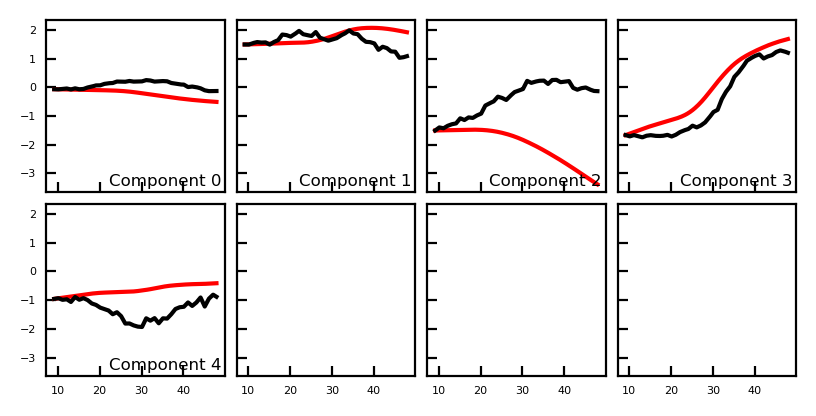

In [ ]:
pca_pred = x_model.transform(x_pred.reshape([x_pred.shape[0], -1]))
pca_true = x_model.transform(x_int(times).reshape([pca_pred.shape[0], -1]))

print(pca_pred.shape)

pca_pred = pca_pred[:, keep_test]
pca_true = pca_true[:, keep_test]

ncols = min(pca_pred.shape[1], 4)
nrows = ceil(pca_pred.shape[1] / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

for i in range(pca_pred.shape[1]):
    ax[i].plot(times, pca_pred[:, i], color='red')
    ax[i].plot(times, pca_true[:, i], color='black')
    ax[i].text(0.98, 0.02, 'Component %d' % i, fontsize=6, 
               transform=ax[i].transAxes, va='bottom', ha='right')
plt.tight_layout()

# Runt dynamics

We expect pair rule gene stripes to be advected by the flow, i.e. $\partial_t R + \mathbf{v} \cdot \nabla R = 0$

## PCA Information

       time
set        
test    199
train   299


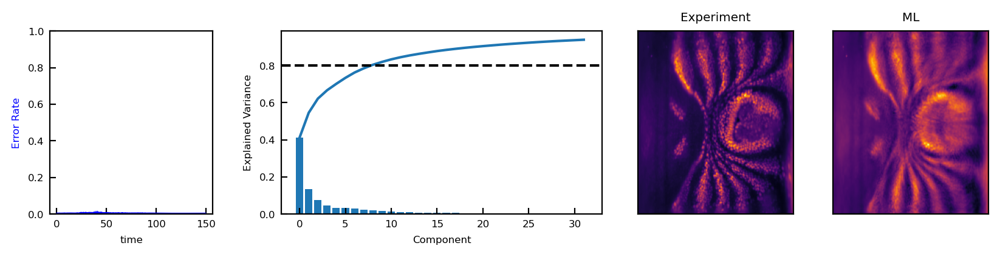

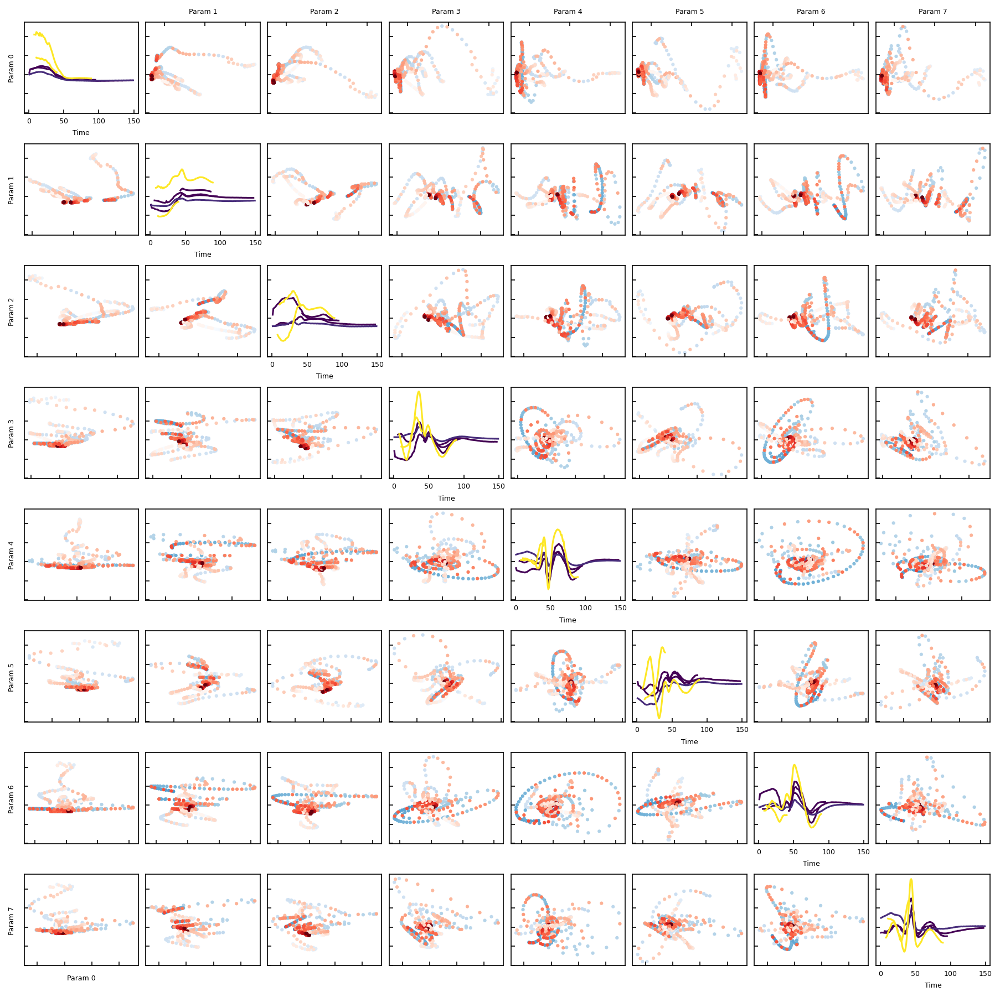

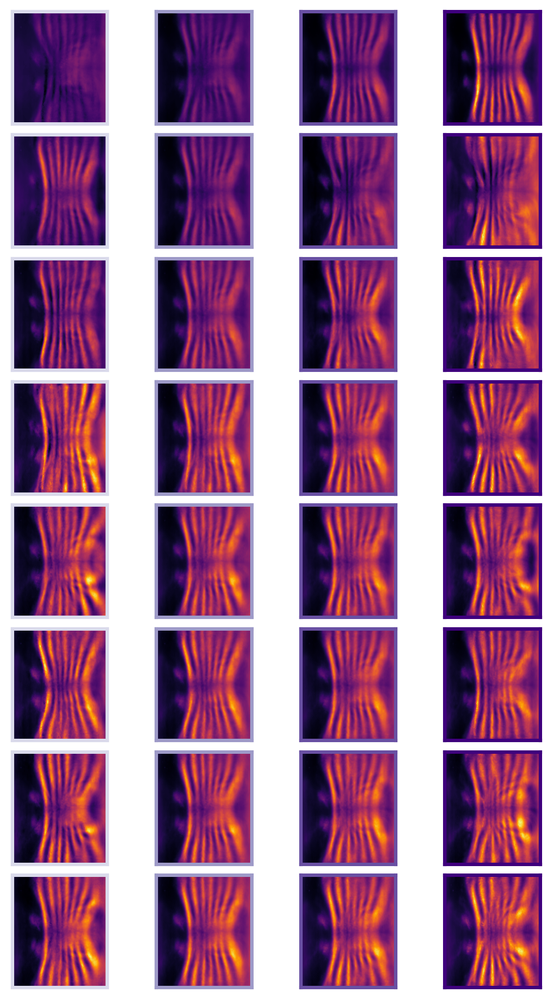

In [7]:
runt_model, runt_df = get_results(runt_dataset, n_components=32, whiten=True)
plot_fn = color_2D
summary_plot(runt_df, runt_model, runt_dataset, 25, show_magnitude=False, cutoff=0.8)
pca_plots(runt_df, runt_model, cutoff=0.8)

       time
set        
test    199
train   299


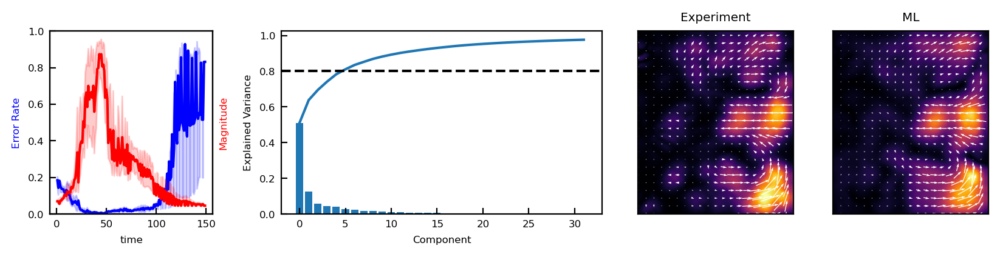

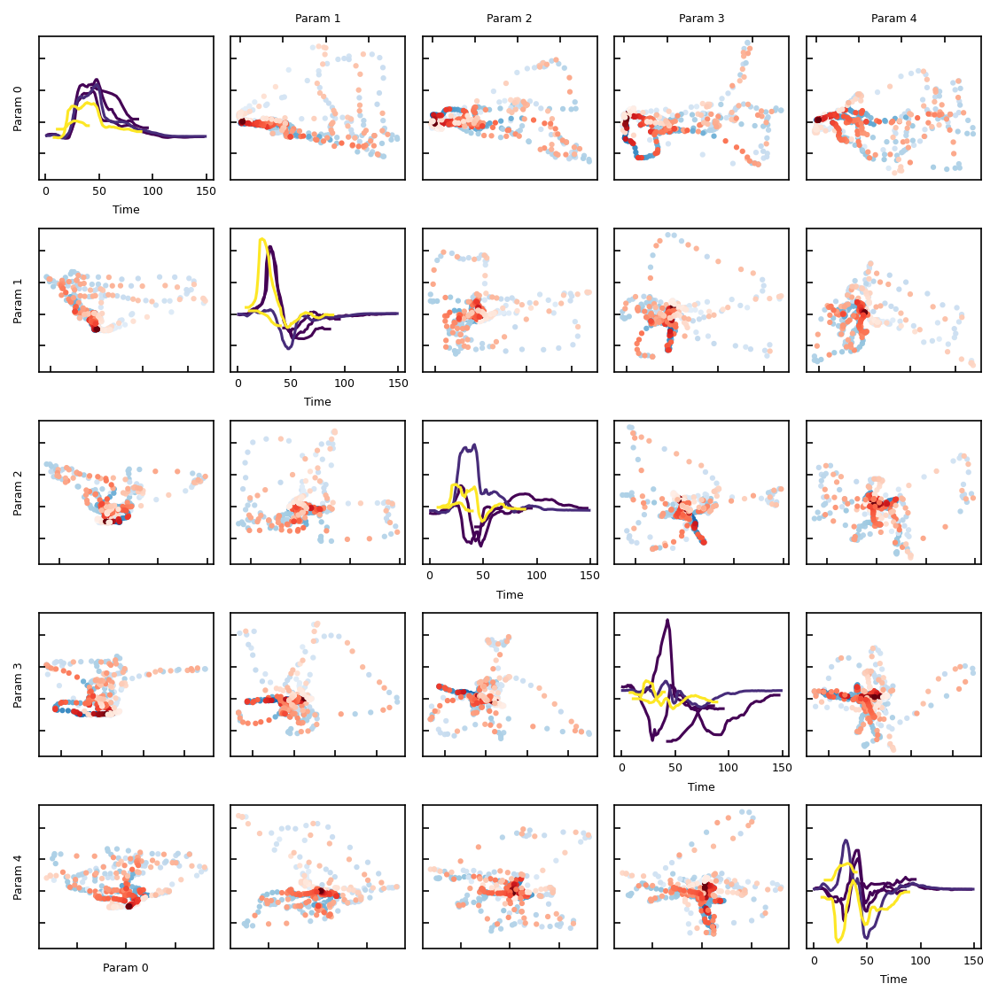

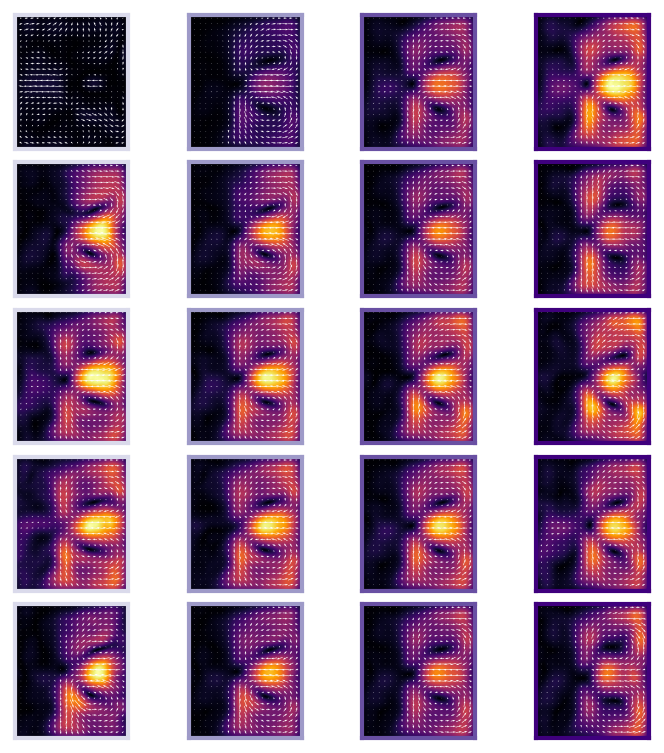

In [8]:
rvel_model, rvel_df = get_results(rvel_dataset, n_components=32, whiten=True)
plot_fn = plot_vector2D
summary_plot(rvel_df, rvel_model, rvel_dataset, 25, show_magnitude=True, cutoff=0.8)
pca_plots(rvel_df, rvel_model, cutoff=0.8)

## SINDy in PCA basis

In [282]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
import pysindy as ps
from pysindy.feature_library.pde_library import PDELibrary

from scipy.io import loadmat
geometry = loadmat('/project/vitelli/jonathan/REDO_fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
XX, YY = geometry['XX'][0, :], geometry['YY'][:, 0]

'''
Step 1. Choose datasets to use
'''
x_model, x_df = runt_model, runt_df.reset_index(drop=True)
u_model, u_df = rvel_model, rvel_df.reset_index(drop=True)

params_x = x_df.filter(like='param', axis=1).values
params_u = u_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_x = np.cumsum(x_model.explained_variance_ratio_) <= 0.9
keep_x[:2] = False #For runt, ignore the first two principal components
keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 0.9

'''
Step 3. Project terms onto subset of meaningful components
'''

X = unpca(params_x[:, keep_x], x_model, keep_x)
U = unpca(params_u[:, keep_u], u_model, keep_u)

'''
Step 4. Compute derivatives
'''

#Split by embryo
diffY = ps.SmoothedFiniteDifference(d=1, axis=0)
diffX = ps.SmoothedFiniteDifference(d=1, axis=1)
diffT = ps.SmoothedFiniteDifference(d=1, axis=2)

tmin = 20
tmax = 90


feature_names = [
    'r',
    'grad^2 r',
    '(grad r)^2',
    'v^2', 
    'div v',
    'v grad r',
]

t = []
x = []
x_dot = []
x_true = []
u_true = []
for i, eID in enumerate(u_df.embryoID.unique()):
    data = u_df[u_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index

    if len(idx) < 30:
        continue
    
    xi = X[idx].transpose(2, 3, 0, 1)
    ui = U[idx].transpose(2, 3, 0, 1)
        
    x_dot.append(diffT._differentiate(xi, data.t.values))
    t.append(data.t.values)
    lib = []
    
    lib.append(xi)
    x_true.append(xi)
    u_true.append(ui)

    
    grad_x = np.stack([
        diffY._differentiate(xi, YY),
        diffX._differentiate(xi, XX),
    ], axis=-1)
    
    lapl_x = diffY._differentiate(grad_x[..., 0], YY) + \
             diffX._differentiate(grad_x[..., 1], XX)
    lib.append(lapl_x)
    
    grad2_x = np.power(grad_x, 2).sum(axis=-1)
    lib.append(grad2_x)
    
    u2 = np.power(ui, 2).sum(axis=-1, keepdims=True)
    lib.append(u2)
    
    grad_u = np.stack([
        diffY._differentiate(ui, YY),
        diffX._differentiate(ui, XX),
    ], axis=-1)
    
    div_u = grad_u[..., 0, 0:1] + grad_u[..., 1, 1:2]
    lib.append(div_u)
    
    u_grad_x = ui[..., 0:1] * grad_x[..., 0] + \
               ui[..., 1:2] * grad_x[..., 1]
    
    lib.append(u_grad_x)
    
    lib = np.concatenate(lib, axis=-1)
    print(lib.shape)
    
    x.append(lib.reshape([-1, lib.shape[-1]]))
    x_dot[-1] = x_dot[-1].reshape([-1, x_dot[-1].shape[-1]])
        
'''
Step 5. Fit model using SINDy
'''
model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.5, alpha=0.),
    feature_names=feature_names
)

model.fit(x=x, x_dot=x_dot, multiple_trajectories=True)
model.print()

(236, 200, 71, 6)
(236, 200, 59, 6)
(236, 200, 63, 6)
(236, 200, 74, 6)
(r)' = 0.798 grad^2 r + -1.049 v grad r


In [283]:
from scipy.interpolate import interp1d

def evolve_rk4_grid(x0, xdot, pca, t, tmin=0, tmax=10, step_size=0.2):
    tt = np.arange(tmin, tmax, step_size)
    x = np.zeros([len(tt), *x0.shape])
    x[0] = x0
    
    print(x0.shape)
        
    interp = interp1d(t, xdot, axis=-2)
    for ii in range(len(tt)-1):
        k1 = interp(tt[ii])
        k2 = interp(tt[ii] + 0.5 * step_size)
        k3 = interp(tt[ii] + 0.5 * step_size)
        k4 = interp(tt[ii] + step_size)
        
        xtt = x[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * step_size / 6
        
        #Project onto PCA components
        xtt = xtt.transpose(2, 0, 1).reshape([1, -1])
        xtt = unpca(pca.transform(xtt)[:, keep_x], pca, keep_x)[0]
        #xtt = xtt.transpose(1, 2, 0)
        x[ii+1] = xtt.transpose(1, 2, 0)

        
    return x.transpose(1, 2, 0, 3), tt

traj = 1
t0 = 25
dt = 25

x_dot_pred = model.model.predict(x[traj])
x_int = interp1d(t[traj], x_true[traj], axis=-2)
u_int = interp1d(t[traj], u_true[traj], axis=-2)
ic = x_int(t0)
x_dot_pred = x_dot_pred.reshape([*ic.shape[:-1], -1, 1])

x_pred, times = evolve_rk4_grid(ic, x_dot_pred, x_model, 
                                t=t[traj], tmin=t0, tmax=t0+dt)

(236, 200, 1)


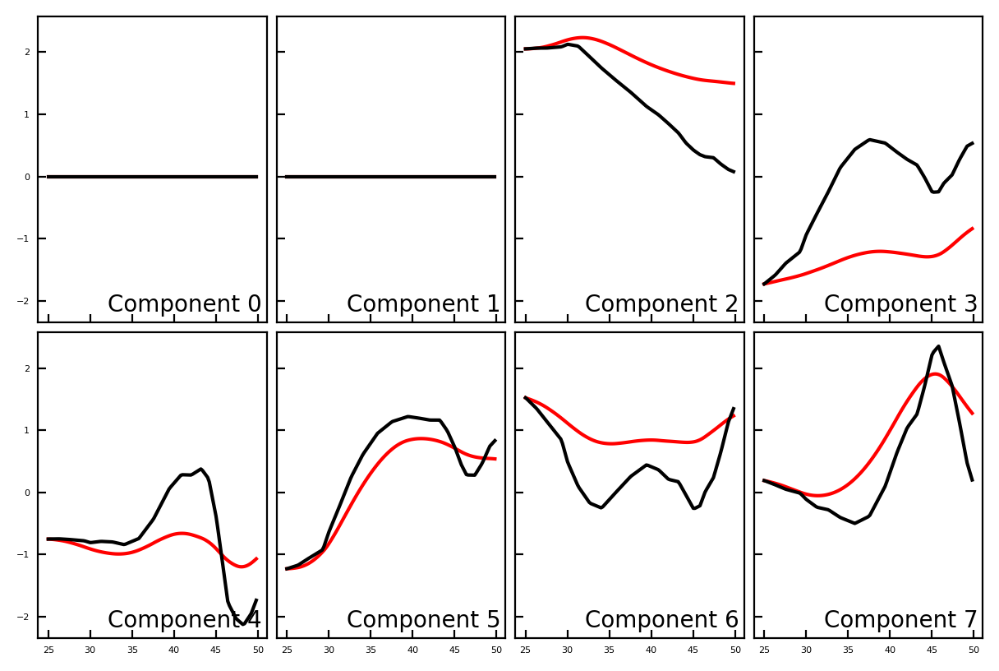

In [284]:
pca_pred = x_model.transform(x_pred.transpose(2, 3, 0, 1).reshape([x_pred.shape[-2], -1]))
pca_true = x_model.transform(x_int(times).transpose(2, 3, 0, 1).reshape([pca_pred.shape[0], -1]))

subset = np.cumsum(x_model.explained_variance_ratio_) <= 0.8

pca_pred = pca_pred[:, subset]
pca_true = pca_true[:, subset]

ncols = 4
fig, ax = plt.subplots(pca_pred.shape[1] // ncols, ncols, 
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

for i in range(len(ax)):
    ax[i].plot(times, pca_pred[:, i], color='red')
    ax[i].plot(times, pca_true[:, i], color='black')
    ax[i].text(0.98, 0.02, 'Component %d' % i, fontsize=10, 
               transform=ax[i].transAxes, va='bottom', ha='right')
plt.tight_layout()

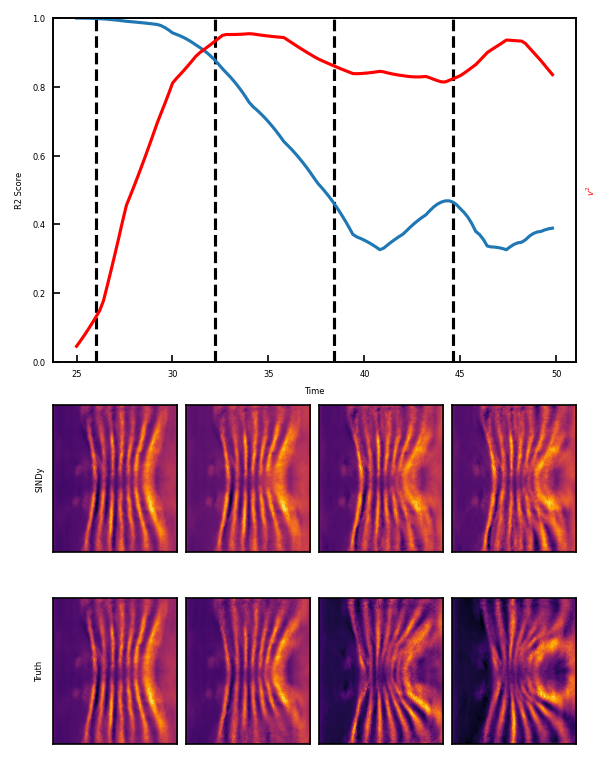

In [285]:
ncols = 4
step = x_pred.shape[-2] // ncols

fig = plt.figure(dpi=150, figsize=(1*ncols, 5))
gs = fig.add_gridspec(4, ncols)

plot_fn = color_2D
ax = fig.add_subplot(gs[:2, :])

from sklearn.metrics import r2_score

error = r2_score(
    x_pred.reshape([-1, x_pred.shape[-2]]),
    x_int(times).reshape([-1, x_pred.shape[-2]]),
    multioutput='raw_values'
)

v2 = np.linalg.norm(u_int(times), axis=-1).mean(axis=(0, 1))

ax.plot(times, error)
ax.set(ylim=[0, 1],
       ylabel='R2 Score',
       xlabel='Time')
ax2 = ax.twinx()
ax2.plot(times, v2, color='red')
ax2.set_yticks([])
ax2.set_ylabel('$v^2$', color='red')


offset = 5
for i in range(ncols):
    ii = i*step + offset
    color_2D(fig.add_subplot(gs[2, i]), x_pred[..., ii, 0])
    if i == 0:
        plt.gca().set_ylabel('SINDy')
    color_2D(fig.add_subplot(gs[3, i]), x_int(times[ii])[..., 0])
    if i == 0:
        plt.gca().set_ylabel('Truth')
    ax.axvline(times[ii], zorder=-1, color='black', linestyle='--')
    
plt.tight_layout()

## SINDy with PCA TransformedTarget Regressor

In [434]:
from sklearn.model_selection import train_test_split
import pysindy as ps
from pysindy.feature_library.pde_library import PDELibrary

from scipy.io import loadmat
geometry = loadmat('/project/vitelli/jonathan/REDO_fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
XX, YY = geometry['XX'][0, :], geometry['YY'][:, 0]

'''
Step 1. Choose datasets to use
'''
x_model, x_df = runt_model, runt_df.reset_index(drop=True)
u_model, u_df = rvel_model, rvel_df.reset_index(drop=True)

params_x = x_df.filter(like='param', axis=1).values
params_u = u_df.filter(like='param', axis=1).values

'''
Step 2. Establish component cutoff 
    Here, this is some threshold for the explained variance ratio
'''
keep_x = np.cumsum(x_model.explained_variance_ratio_) <= 0.9
keep_u = np.cumsum(u_model.explained_variance_ratio_) <= 0.9

'''
Step 3. Project terms onto subset of meaningful components
'''

X = unpca(params_x[:, keep_x], x_model, keep_x)
U = unpca(params_u[:, keep_u], u_model, keep_u)

'''
Step 4. Compute derivatives
'''

#Split by embryo
diffT = ps.SmoothedFiniteDifference(d=1, axis=0)
diffY = ps.SmoothedFiniteDifference(d=1, axis=-2)
diffX = ps.SmoothedFiniteDifference(d=1, axis=-1)

tmin = 20
tmax = 90


feature_names = [
    'r',
    'grad^2 r',
    '(grad r)^2',
    'v^2', 
    'div v',
    'v grad r',
]

t = []
x = []
x_dot = []
x_true = []
u_true = []
for i, eID in enumerate(u_df.embryoID.unique()):
    data = u_df[u_df.embryoID == eID]
    data = data[(data.t >= tmin) & (data.t <= tmax)]
    idx = data.index

    if len(idx) < 30:
        continue
    
    xi = X[idx]
    ui = U[idx]
        
    x_dot.append(diffT._differentiate(xi, data.t.values)[..., None])
    t.append(data.t.values)

    x_true.append(xi)
    u_true.append(ui)
    
    '''
    Pure scalar terms
    '''

    
    grad_x = np.stack([
        diffY._differentiate(xi, YY),
        diffX._differentiate(xi, XX),
    ], axis=-1)
    
    lapl_x = diffY._differentiate(grad_x[..., 0], YY) + \
             diffX._differentiate(grad_x[..., 1], XX)
    
    grad2_x = np.power(grad_x, 2).sum(axis=-1)
    
    '''
    Pure vector terms
    '''
    
    u2 = np.power(ui, 2).sum(axis=1, keepdims=True)
    
    diffY.axis = -2
    diffX.axis = -1
    
    grad_u = np.stack([
        diffY._differentiate(ui, YY),
        diffX._differentiate(ui, XX),
    ], axis=-1)
    
    div_u = grad_u[:, 0:1, ..., 0] = grad_u[:, 1:2, ..., 1]
    
    '''
    Mixed terms
    '''
    u_grad_x = ui[:, 0:1] * grad_x[..., 0] + \
               ui[:, 1:2] * grad_x[..., 1]
    
    
    lib = []
    lib.append(xi)
    lib.append(lapl_x)
    lib.append(grad2_x)
    lib.append(u2)
    lib.append(div_u)
    lib.append(u_grad_x)
    
    lib = np.stack(lib, axis=-1)    
    x.append(lib)
    print(x_dot[-1].shape, x[-1].shape)

(71, 1, 236, 200, 1) (71, 1, 236, 200, 6)
(59, 1, 236, 200, 1) (59, 1, 236, 200, 6)
(63, 1, 236, 200, 1) (63, 1, 236, 200, 6)
(74, 1, 236, 200, 1) (74, 1, 236, 200, 6)


(71, 1, 236, 200)


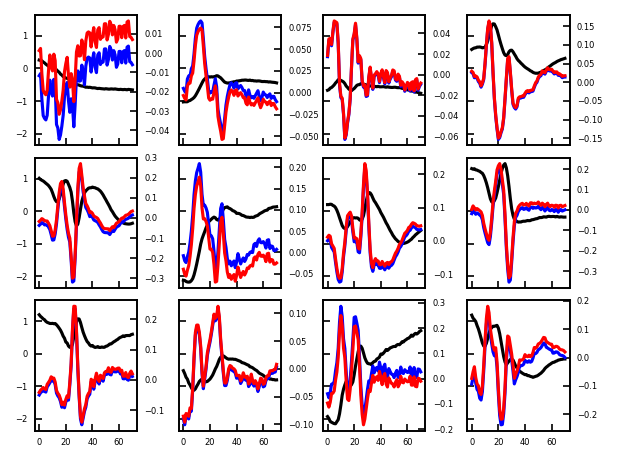

In [435]:
#Check that PCA behaves correctly under differentiation?

traj = 0
xi = x[traj][..., 0]
print(xi.shape)

pca_x = x_model.transform(xi.reshape([xi.shape[0], -1]))
d_pca_x = np.gradient(pca_x, axis=0)

pca_xd = x_model.transform(np.gradient(xi, axis=0).reshape([xi.shape[0], -1]))
pca_xd -= np.mean(pca_xd, axis=0, keepdims=True) #We have to remove bias to make this linear

subset = np.cumsum(x_model.explained_variance_ratio_) <= 0.85

pca_x = pca_x[:, subset]
pca_xd = pca_xd[:, subset]
d_pca_x = d_pca_x[:, subset]

ncols = 4
nrows = ceil(pca_x.shape[1] / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(ncols, nrows),
                       sharey=True, sharex=True, dpi=150)
ax = ax.flatten()

for i in range(ax.shape[0]):
    ax[i].plot(pca_x[:, i], color='black')
    ax2 = ax[i].twinx()
    ax2.plot(d_pca_x[:, i], color='blue')
    ax2.plot(pca_xd[:, i], color='red')
    
plt.tight_layout()

(71, 1, 236, 200, 6)
(71, 236, 200, 7)


,feature,min,max,mean,std
0,r_dot,1.253399e-09,0.114951,0.007905,0.010283
1,r,6.773657e-01,2.834998,1.058792,0.146623
2,grad^2 r,3.422747e-10,0.043211,0.001358,0.001795
3,(grad r)^2,1.630450e-12,0.020429,0.000128,0.000376
4,v^2,1.117515e-08,89.209130,1.909595,5.035569
5,div v,0.000000e+00,0.114327,0.005876,0.008417
6,v grad r,1.029143e-10,0.149236,0.004289,0.008396


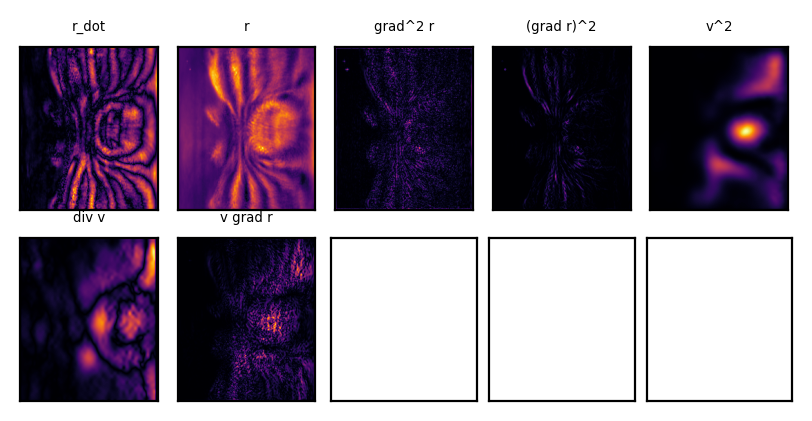

In [436]:
#Show library
from math import ceil

traj = 0
tt = 45

ncols = 5
nrows = ceil((x[traj].shape[-1]+1) / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       figsize=(.8*ncols, nrows),
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

plt.rcParams['font.size'] = 4

color_2D(ax[0], x_dot[traj][tt, ..., 0])
ax[0].set_title('r_dot')
for i in range(x[traj].shape[-1]):
    color_2D(ax[i+1], x[traj][tt, ..., i])
    ax[i+1].set_title(feature_names[i])

plt.tight_layout()
print(x[0].shape)
fnorm = np.linalg.norm(np.concatenate([x_dot[0], x[0]], axis=-1), axis=(1))
print(fnorm.shape)

df = pd.DataFrame({
    'feature': ['r_dot',] + feature_names,
    'min': np.min(fnorm, axis=(0, 1, 2)),
    'max': np.max(fnorm, axis=(0, 1, 2)),
    'mean': np.mean(fnorm, axis=(0, 1, 2)),
    'std': np.std(fnorm, axis=(0, 1, 2)),
})
df

In [437]:
'''
Step 5. Project library onto PCA basis
'''
def pca_trajectory(x):
    #x shape [T, C, Y, X, L]
    xi = x.transpose(0, 4, 1, 2, 3) # [T, L, C, Y, X]
    xi= xi.reshape([x.shape[0]*x.shape[-1], -1]) # [T*L, C, Y, X]
    xi = x_model.transform(xi) # [T*L, P]
    xi = xi.reshape([x.shape[0], -1, xi.shape[-1]]) # [T, L, P]
    xi -= np.mean(xi, axis=0, keepdims=True)
    xi = xi.transpose(0, 2, 1) #[T, P, L]
    return xi

keep_x = np.zeros(x_model.n_components_, dtype=bool)
keep_x[2:10] = True

x_pca = []
x_dot_pca = []
for i in range(len(x)):
    x_pca.append(pca_trajectory(x[i])[:, keep_x])
    x_dot_pca.append(pca_trajectory(x_dot[i])[:, keep_x])
    print(x[i].shape, x_pca[i].shape)

(71, 1, 236, 200, 6) (71, 8, 6)
(59, 1, 236, 200, 6) (59, 8, 6)
(63, 1, 236, 200, 6) (63, 8, 6)
(74, 1, 236, 200, 6) (74, 8, 6)


In [442]:
'''
Step 6. Fit model using SINDy
'''

model = ps.SINDy(
    feature_library=ps.IdentityLibrary(),
    optimizer=ps.STLSQ(threshold=0.5, alpha=0.1),
    feature_names=feature_names
)

model.fit(x=x_pca, x_dot=x_dot_pca, multiple_trajectories=True)
model.print()

(r)' = 3.573 grad^2 r + -4.487 (grad r)^2 + -3.731 v grad r


In [443]:
from scipy.interpolate import interp1d
from tqdm import tqdm

def evolve_rk4_grid(x0, xdot, pca, t, tmin=0, tmax=10, step_size=0.2):
    tt = np.arange(tmin, tmax, step_size)
    x = np.zeros([len(tt), *x0.shape])
    x[0] = x0
        
    interp = interp1d(t, xdot, axis=0)
    for ii in tqdm(range(len(tt)-1)):
        k1 = interp(tt[ii])
        k2 = interp(tt[ii] + 0.5 * step_size)
        k3 = interp(tt[ii] + 0.5 * step_size)
        k4 = interp(tt[ii] + step_size)
                
        xtt = x[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * step_size / 6
        
        #Project onto PCA components
        xtt = xtt.reshape([1, -1])
        xtt = unpca(pca.transform(xtt)[:, keep_x], pca, keep_x).reshape(x[ii].shape)
        x[ii+1] = xtt

        
    return x, tt


traj = 1
t0 = 25
dt = 25

xi = x[traj]

x_dot_pred = model.model.predict(xi.reshape([-1, xi.shape[-1]])).reshape(x_dot[traj].shape)[..., 0]
print(x_dot_pred.shape)
x_int = interp1d(t[traj], x_true[traj], axis=0)
u_int = interp1d(t[traj], u_true[traj], axis=0)
ic = x_int(t0)

x_pred, times = evolve_rk4_grid(ic, x_dot_pred, x_model, 
                                t=t[traj], tmin=t0, tmax=t0+dt)

(59, 1, 236, 200)


100%|██████████| 124/124 [00:00<00:00, 169.53it/s]


(125, 32)


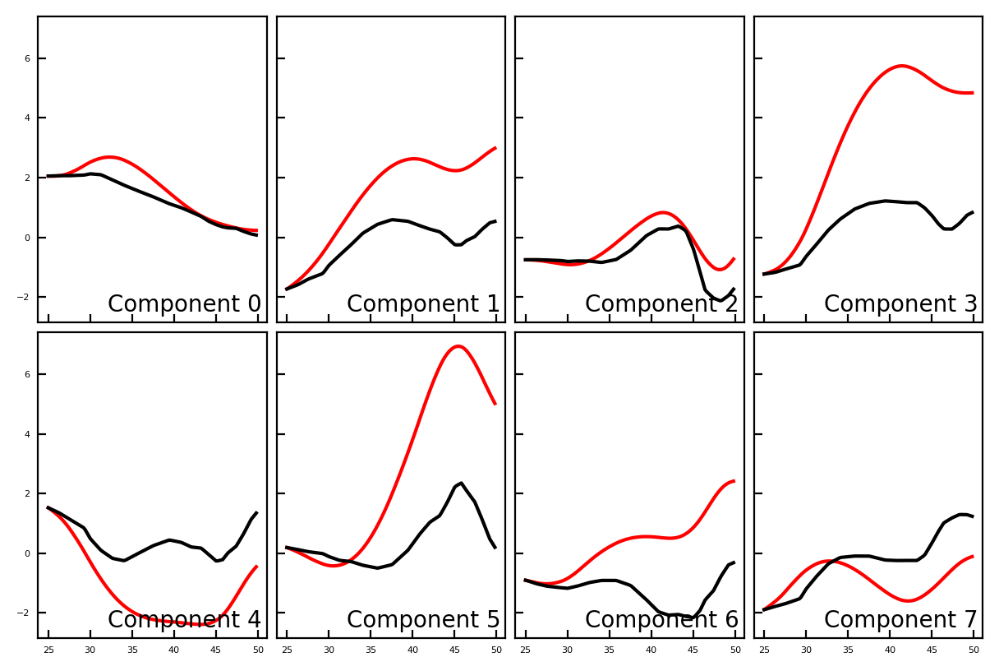

In [444]:
pca_pred = x_model.transform(x_pred.reshape([x_pred.shape[0], -1]))
pca_true = x_model.transform(x_int(times).reshape([pca_pred.shape[0], -1]))

print(pca_pred.shape)

pca_pred = pca_pred[:, keep_x]
pca_true = pca_true[:, keep_x]

ncols = 4
nrows = ceil(pca_pred.shape[1] / ncols)
fig, ax = plt.subplots(nrows, ncols, 
                       sharey=True, sharex=True, dpi=200)
ax = ax.flatten()

for i in range(pca_pred.shape[1]):
    ax[i].plot(times, pca_pred[:, i], color='red')
    ax[i].plot(times, pca_true[:, i], color='black')
    ax[i].text(0.98, 0.02, 'Component %d' % i, fontsize=10, 
               transform=ax[i].transAxes, va='bottom', ha='right')
plt.tight_layout()

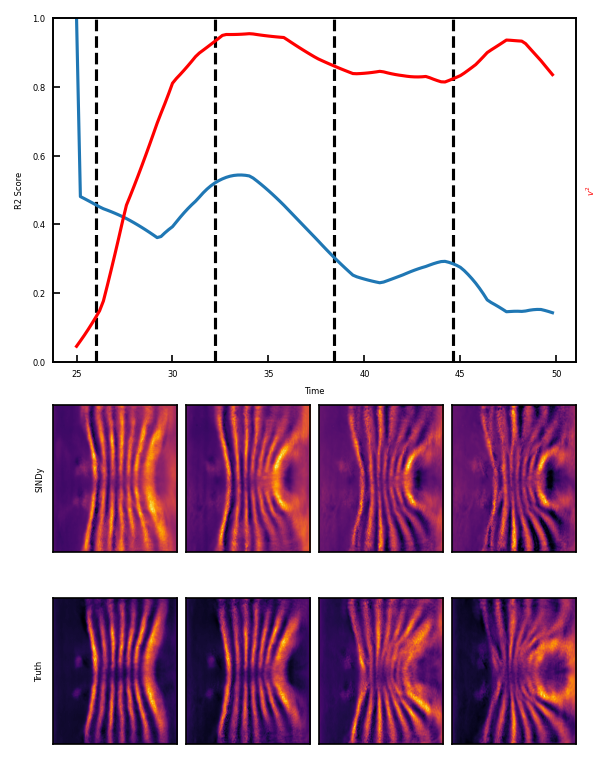

In [445]:
ncols = 4
step = x_pred.shape[0] // ncols

fig = plt.figure(dpi=150, figsize=(1*ncols, 5))
gs = fig.add_gridspec(4, ncols)

plot_fn = color_2D
ax = fig.add_subplot(gs[:2, :])

from sklearn.metrics import r2_score

error = r2_score(
    x_pred.reshape([x_pred.shape[0], -1]).T,
    x_int(times).reshape([x_pred.shape[0], -1]).T,
    multioutput='raw_values'
)

v2 = np.linalg.norm(u_int(times), axis=1).mean(axis=(1, 2))

ax.plot(times, error)
ax.set(ylim=[0, 1],
       ylabel='R2 Score',
       xlabel='Time')
ax2 = ax.twinx()
ax2.plot(times, v2, color='red')
ax2.set_yticks([])
ax2.set_ylabel('$v^2$', color='red')


offset = 5
for i in range(ncols):
    ii = i*step + offset
    color_2D(fig.add_subplot(gs[2, i]), x_pred[ii])
    if i == 0:
        plt.gca().set_ylabel('SINDy')
    color_2D(fig.add_subplot(gs[3, i]), x_int(times[ii]))
    if i == 0:
        plt.gca().set_ylabel('Truth')
    ax.axvline(times[ii], zorder=-1, color='black', linestyle='--')
    
plt.tight_layout()